In [ ]:
# Basic libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import iqr

from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# Pandas visualization
from pandas.plotting import scatter_matrix

# PyTorch for deep learning
import torch
from torch import nn
from torch.utils.data import DataLoader, Dataset, TensorDataset

# Scikit-learn for preprocessing, model selection, and metrics
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import KFold, train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

# Jupyter notebook display setting
%config InlineBackend.figure_format = 'retina'

from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


# Loading Date

In [ ]:
# Define the path to the dataset
data_file = "/content/drive/MyDrive/MLPS Project/covidcast_new.csv"

# Load the COVID dataset into a DataFrame
covid_df = pd.read_csv(data_file)

# Convert the 'time_value' column to datetime format
covid_df['time_value'] = pd.to_datetime(covid_df['time_value'])

# Extract the list of unique counties (geo identifiers)
all_counties = covid_df['geo_value'].unique()

# Generate a complete date range from the earliest to latest date in the dataset
all_dates = pd.date_range(start=covid_df['time_value'].min(), end=covid_df['time_value'].max())

# Specify the target variables to be predicted
target_vars = ['smoothed_wtested_positive_14d', 'smoothed_wcovid_vaccinated']

# Define the indexing columns (county and date)
idx_vars = ['geo_value', 'time_value']

# Define feature variables by excluding target and index columns from the dataset
feature_vars = [x for x in covid_df.columns if (x not in target_vars) & (x not in idx_vars)]

feature_vars

['smoothed_wspent_time_1d',
 'smoothed_wtested_14d',
 'smoothed_wpublic_transit_1d',
 'smoothed_wcovid_vaccinated_or_accept',
 'smoothed_wworried_become_ill',
 'smoothed_wvaccine_likely_govt_health',
 'smoothed_wshop_1d',
 'smoothed_wwork_outside_home_1d',
 'smoothed_wothers_masked',
 'smoothed_wcli',
 'smoothed_wvaccine_likely_friends',
 'smoothed_wrestaurant_1d',
 'smoothed_wvaccine_likely_politicians',
 'smoothed_wvaccine_likely_who',
 'smoothed_wwearing_mask',
 'smoothed_wlarge_event_1d']

In [ ]:
# Create a complete MultiIndex of all (county, date) combinations
# geo_value    time_value    feature1
# 1000            2020-01-01    0.1
# 1000            2020-01-02    NaN    # ← filled: missing date for 1000
# 1000            2020-01-03    0.3
# 1001            2020-01-01    0.2
# 1001            2020-01-02    NaN    # ← filled: missing date for 1001
# 1001            2020-01-03    NaN    # ← filled: missing date for 1001

# This ensures we have a full time series for each county, even if some dates are missing in the original data
full_index = pd.MultiIndex.from_product([all_counties, all_dates], names=idx_vars)

# Set the DataFrame index to (geo_value, time_value) to align with the structure of the full index
covid_df = covid_df.set_index(idx_vars)

# Reindex the DataFrame using the full index
# This inserts rows with NaNs for any (county, date) pair that was missing in the original data
covid_df = covid_df.reindex(full_index).reset_index()

# Sort the DataFrame by county and date to ensure time order within each county
covid_df = covid_df.sort_values(idx_vars).reset_index(drop=True)

# Print the final shape of the aligned dataset (should be num_counties × num_dates)
print(covid_df.shape)

# Preview the first few rows to verify the structure and presence of NaNs
covid_df.head()


(29230, 20)


,geo_value,time_value,smoothed_wspent_time_1d,smoothed_wtested_14d,smoothed_wpublic_transit_1d,smoothed_wcovid_vaccinated_or_accept,smoothed_wworried_become_ill,smoothed_wvaccine_likely_govt_health,smoothed_wshop_1d,smoothed_wtested_positive_14d,smoothed_wwork_outside_home_1d,smoothed_wothers_masked,smoothed_wcli,smoothed_wcovid_vaccinated,smoothed_wvaccine_likely_friends,smoothed_wrestaurant_1d,smoothed_wvaccine_likely_politicians,smoothed_wvaccine_likely_who,smoothed_wwearing_mask,smoothed_wlarge_event_1d
0,1000,2021-01-07,34.412959,12.541558,1.464798,54.340471,65.771681,22.086274,52.854667,29.288429,30.487852,57.334785,3.244379,2.638200,28.469582,18.571266,9.482316,24.962112,84.311759,12.627098
1,1000,2021-01-08,32.923002,12.874330,1.573930,55.051154,66.163066,21.676125,52.782927,30.565406,30.816338,57.404725,3.192889,2.796690,29.411829,16.770287,9.301872,25.389859,85.395900,11.440308
2,1000,2021-01-09,32.295620,12.606491,2.113477,55.394081,65.424462,22.024837,52.899596,32.079678,33.790678,55.769996,3.160820,3.890739,30.243256,17.230085,9.166208,25.449957,85.152333,12.031933
3,1000,2021-01-10,30.920904,13.322862,1.893699,56.824111,65.437305,22.475933,52.009380,33.274184,34.066870,57.162993,2.948510,4.138483,30.616066,17.014867,9.555914,26.661562,86.100625,11.805525
4,1000,2021-01-11,29.945516,15.070881,1.701077,58.303503,66.113380,21.603154,50.781900,32.211618,32.611276,58.430549,3.184975,4.527817,30.792684,16.026808,9.192875,25.500847,86.711637,10.713526


# Original Data Behavior

## Missing Values

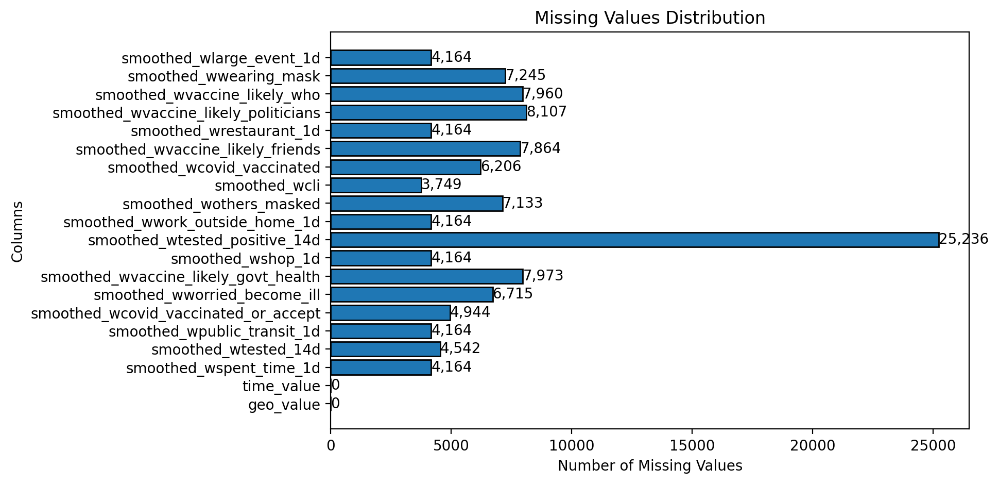

In [ ]:
# Calculate the number of missing values for each column
missing_values = [sum(pd.isnull(covid_df[i])) for i in covid_df.columns]

# Create a horizontal bar chart
plt.figure(figsize=(8, 5))
bars = plt.barh(covid_df.columns, missing_values, edgecolor='black')

# Annotate each bar with the exact missing value count
for bar in bars:
    plt.text(bar.get_width() + 1,                      # x position (right of bar)
             bar.get_y() + bar.get_height() / 2,       # y position (center of bar)
             f'{bar.get_width():,.0f}',                # formatted count
             va='center', fontsize=10)

# Set axis labels and chart title
plt.ylabel("Columns")
plt.xlabel("Number of Missing Values")
plt.title("Missing Values Distribution")

# Display the chart
plt.show()

## Boxplot

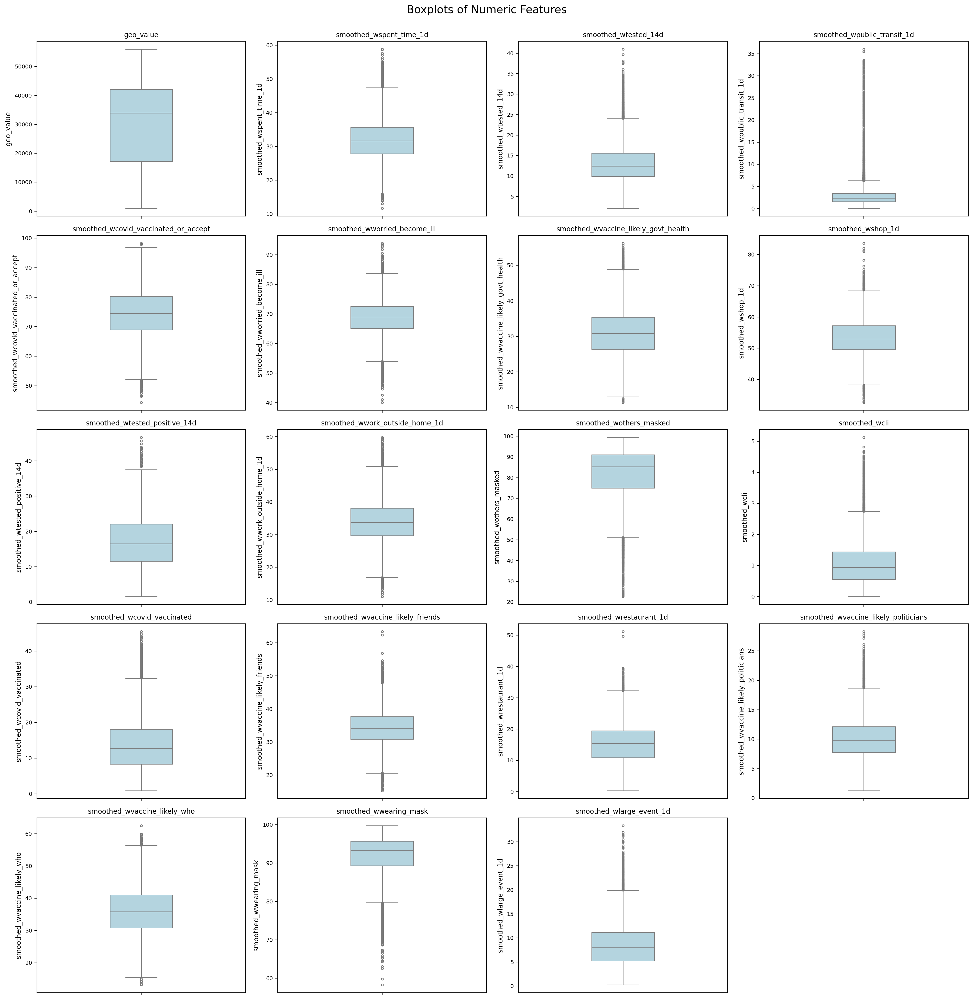

In [ ]:
# Select only numeric columns for boxplot visualization
numeric_cols = covid_df.select_dtypes(include='number').columns.tolist()

# Determine grid layout
num_vars = len(numeric_cols)
num_cols = 4  # Max 4 plots per row
num_rows = (num_vars // num_cols) + int(num_vars % num_cols > 0)

# Create subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
axs = axs.flatten()

# Plot each variable as a vertical boxplot
for idx, col in enumerate(numeric_cols):
    sns.boxplot(y=covid_df[col], ax=axs[idx], color='lightblue', width=0.3, fliersize=3)
    axs[idx].set_title(col, fontsize=10)
    axs[idx].tick_params(axis='y', labelsize=8)

# Hide any unused axes
for j in range(idx + 1, len(axs)):
    fig.delaxes(axs[j])

# Layout adjustment
plt.tight_layout()
plt.suptitle("Boxplots of Numeric Features", fontsize=16, y=1.02)
plt.show()

## Correlation Matrix Map

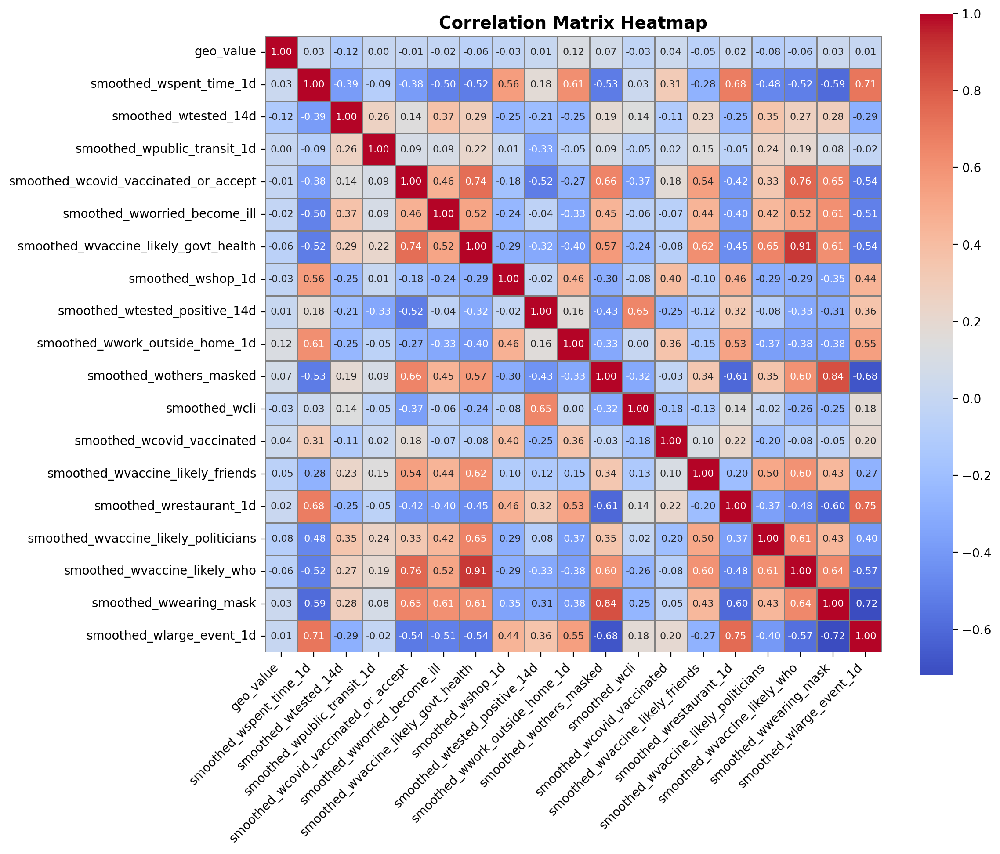

In [ ]:
# Compute correlation matrix using only numeric columns
corr_matrix = covid_df.select_dtypes(include='number').corr()

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Draw the heatmap with annotations
sns.heatmap(
    corr_matrix,
    annot=True,               # show correlation coefficients
    fmt=".2f",                # format to 2 decimal places
    cmap="coolwarm",          # color scheme
    cbar=True,                # show color bar
    square=True,              # make cells square
    linewidths=0.5,           # line between cells
    linecolor='gray',         # line color
    annot_kws={"size": 8}     # annotation text size
)

# Title and layout
plt.title("Correlation Matrix Heatmap", fontsize=14, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Data Cleaning

## Missing Values - Features

In [ ]:
# Print the original number of unique counties before any cleaning
print("=" * 50)
print(f"Original number of counties: {len(all_counties)}")
print("=" * 50)

print("Filling missing values for each feature (forward + backward fill):")
for column in feature_vars:
    # Fill missing values within each county using forward-fill then backward-fill
    covid_df[column] = covid_df.groupby('geo_value')[column].transform(lambda x: x.ffill().bfill())

    # Count remaining missing values in the column
    num_missing = covid_df[column].isnull().sum()

    # Print status per feature
    print(f"   - {column:30s} → Remaining missing values: {num_missing}")

print("=" * 50)
print("Filtering out counties that still have missing feature values...")
print(f"Columns excluded from this check: {target_vars}")

# Remove counties that still contain missing values in any feature column (excluding targets)
covid_df = covid_df.groupby('geo_value').filter(
    lambda group: not group.drop(columns=target_vars).isna().any().any()
).reset_index(drop=True)

# Recalculate list of valid counties
all_counties = covid_df['geo_value'].unique()

# Print final retained counties count
print(f"Number of counties retained after cleaning: {len(all_counties)}")
print("=" * 50)


Original number of counties: 790
Filling missing values for each feature (forward + backward fill):
   - smoothed_wspent_time_1d        → Remaining missing values: 111
   - smoothed_wtested_14d           → Remaining missing values: 851
   - smoothed_wpublic_transit_1d    → Remaining missing values: 111
   - smoothed_wcovid_vaccinated_or_accept → Remaining missing values: 1369
   - smoothed_wworried_become_ill   → Remaining missing values: 3034
   - smoothed_wvaccine_likely_govt_health → Remaining missing values: 2960
   - smoothed_wshop_1d              → Remaining missing values: 111
   - smoothed_wwork_outside_home_1d → Remaining missing values: 111
   - smoothed_wothers_masked        → Remaining missing values: 3404
   - smoothed_wcli                  → Remaining missing values: 74
   - smoothed_wvaccine_likely_friends → Remaining missing values: 2405
   - smoothed_wrestaurant_1d        → Remaining missing values: 111
   - smoothed_wvaccine_likely_politicians → Remaining missing valu

## Outliers - Features

In [ ]:

outlier_indices_all = set() # used to store all outlier indices across features


n_cols = 5
n_rows = (len(feature_vars) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 6, n_rows * 4))
axes = axes.flatten()

#iterate through each numeric feature
for i, column in enumerate(feature_vars):

    data = covid_df[[column]].dropna()  # Drop NaN values before processing

    data_scaled = StandardScaler().fit_transform(data)
    # standardize the data to have mean=0 and variance=1

    # initialize DBSCAN with parameters
    # eps: maximum distance between two samples for one to be considered as in the neighborhood of the other
    # min_samples: number of samples in a neighborhood for a point to be considered as a core point
    dbscan = DBSCAN(eps=0.5, min_samples=5)

    labels = dbscan.fit_predict(data_scaled)
    # fit_predict: fit the model and predict the cluster labels for each point
    # labels: -1 for outliers, 0 for core points, and other integers for different clusters

    outlier_idx = data.index[labels == -1]  # select the outliers
    normal_idx = data.index[labels != -1]

    outlier_indices_all.update(outlier_idx)  # update the set of all outlier indices

    # plotting
    ax = axes[i]

    ax.scatter(normal_idx, covid_df.loc[normal_idx, column], label='Normal', alpha=0.5)
    ax.scatter(outlier_idx, covid_df.loc[outlier_idx, column], color='red', label='Outlier', alpha=0.8)
    ax.set_title(column)
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    ax.legend()



covid_df = covid_df.loc[~covid_df.index.isin(outlier_indices_all)]

# remove empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])


print(f'Total Number of Outliers: {len(outlier_indices_all)}')
fig.tight_layout()
plt.show()

print(covid_df.columns)

Output hidden; open in https://colab.research.google.com to view.

## Save final data

In [ ]:
covid_df.to_csv('final_dataset.csv', index=False)

# smoothed_wtested_positive_14d

## Loading Dataset

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.base import clone
from sklearn.model_selection import train_test_split, KFold, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor
import joblib
import warnings
warnings.filterwarnings('ignore')

In [ ]:
#  Load final dataset
# positivity_df = pd.read_csv('/content/drive/MyDrive/MLPS Project/final_dataset.csv')
positivity_df = pd.read_csv('final_dataset.csv')
positivity_df['time_value'] = pd.to_datetime(positivity_df['time_value'])

if 'diff_days' not in positivity_df.columns:
  # Add a column representing the number of days since the first date (for time encoding)
  positivity_df['diff_days'] = (positivity_df['time_value'] - positivity_df['time_value'].min()).dt.days

print("diff_days range:", positivity_df['diff_days'].min(), "→", positivity_df['diff_days'].max())

# Define variables
target_vars = ['smoothed_wtested_positive_14d']
idx_vars = ['geo_value', 'time_value']
exclud_vars = target_vars + idx_vars
feature_vars = [x for x in positivity_df.columns if (x not in exclud_vars)]

# Split dataset into labeled and unlabeled parts based on positivity label
labeled_df = positivity_df[positivity_df['smoothed_wtested_positive_14d'].notna()]
unlabeled_df = positivity_df[positivity_df['smoothed_wtested_positive_14d'].isna()]

print(f"Number of labeled rows: {len(labeled_df)}")
print(f"Number of unlabeled rows: {len(unlabeled_df)}")


diff_days range: 0 → 36
Number of labeled rows: 3899
Number of unlabeled rows: 21513


In [ ]:
# Use the labeled dataset for our analysis and modeling
df = labeled_df.copy()
print(f"Working with dataset of shape: {df.shape}")

# Display the first few rows and column information
print("\nFirst few rows:")
print(df.head())

# Check if we still have any missing values
missing_values = df.isnull().sum()
print("\nMissing values per column:")
print(missing_values[missing_values > 0])
missing_count = missing_values.sum()
print(f"\nTotal missing values in labeled dataset: {missing_count}")

# Drop rows with any missing values
df = df.dropna()
print(f"\nDataset shape after dropping missing values: {df.shape}")

# Define our target variable
target_column = 'smoothed_wtested_positive_14d'

# Get a list of all feature columns
feature_columns = feature_vars  # Include our time encoding feature
print(f"\nTarget variable: {target_column}")
print(f"Number of features: {len(feature_columns)}")
print(f"Features: {feature_columns}")

Working with dataset of shape: (3899, 21)

First few rows:
   geo_value time_value  smoothed_wspent_time_1d  smoothed_wtested_14d  \
0       1000 2021-01-07                34.412959             12.541558   
1       1000 2021-01-08                32.923002             12.874330   
2       1000 2021-01-09                32.295620             12.606491   
3       1000 2021-01-10                30.920904             13.322862   
4       1000 2021-01-11                29.945516             15.070881   

   smoothed_wpublic_transit_1d  smoothed_wcovid_vaccinated_or_accept  \
0                     1.464798                             54.340471   
1                     1.573930                             55.051154   
2                     2.113477                             55.394081   
3                     1.893699                             56.824111   
4                     1.701077                             58.303503   

   smoothed_wworried_become_ill  smoothed_wvaccine_likely_govt_

## Feature Correlation Analysis with Target Variable



Feature Correlation Analysis

Top positive correlations with target:
smoothed_wcli                           0.647241
smoothed_wlarge_event_1d                0.363355
smoothed_wrestaurant_1d                 0.318942
smoothed_wspent_time_1d                 0.181908
smoothed_wwork_outside_home_1d          0.157260
smoothed_wshop_1d                      -0.015882
smoothed_wworried_become_ill           -0.042730
smoothed_wvaccine_likely_politicians   -0.084100
smoothed_wvaccine_likely_friends       -0.118052
smoothed_wtested_14d                   -0.211296
Name: smoothed_wtested_positive_14d, dtype: float64

Top negative correlations with target:
smoothed_wvaccine_likely_friends       -0.118052
smoothed_wtested_14d                   -0.211296
smoothed_wcovid_vaccinated             -0.252501
diff_days                              -0.276180
smoothed_wwearing_mask                 -0.305864
smoothed_wvaccine_likely_govt_health   -0.317497
smoothed_wvaccine_likely_who           -0.325748
smoo

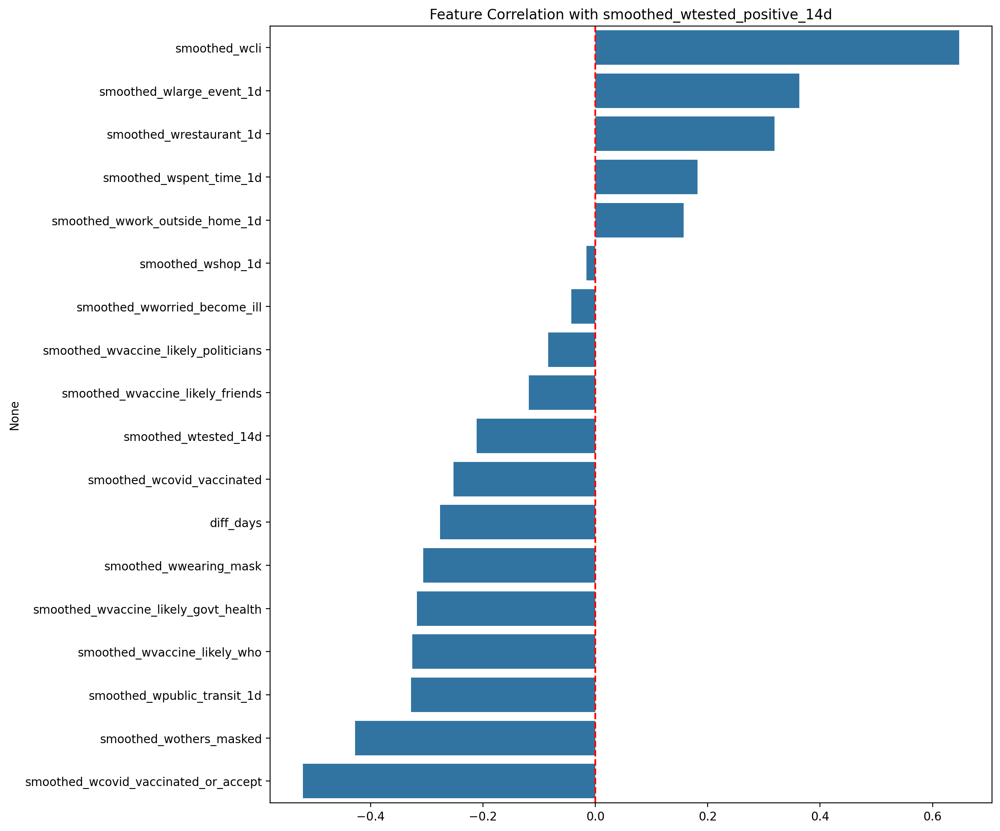

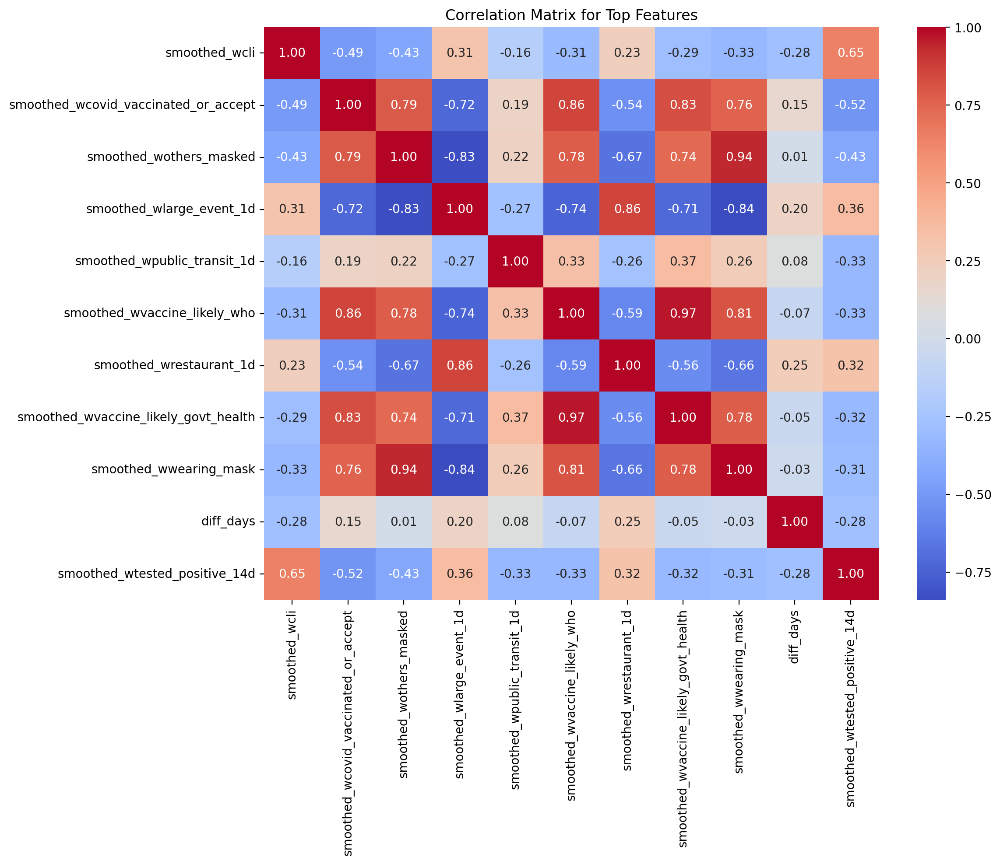

In [ ]:
# -------------------------------------------------------------------------------
# Feature Correlation Analysis
# -------------------------------------------------------------------------------

print("\n\n" + "="*50)
print("Feature Correlation Analysis")
print("="*50)

# Calculate correlation with target
correlation_with_target = df[list(feature_columns) + [target_column]].corr()[target_column].drop(target_column)
correlation_with_target = correlation_with_target.sort_values(ascending=False)

# Display correlations
print("\nTop positive correlations with target:")
print(correlation_with_target.head(10))

print("\nTop negative correlations with target:")
print(correlation_with_target.tail(10))

# Simple bar plot of correlations
plt.figure(figsize=(12, 10))
sns.barplot(x=correlation_with_target.values, y=correlation_with_target.index)
plt.title(f'Feature Correlation with {target_column}')
plt.axvline(x=0, color='red', linestyle='--')
plt.tight_layout()
plt.show()
plt.close()

# Correlation heatmap for top features
top_features = list(correlation_with_target.abs().sort_values(ascending=False).head(10).index)
plt.figure(figsize=(12, 10))
sns.heatmap(df[top_features + [target_column]].corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix for Top Features')
plt.tight_layout()
plt.show()
plt.close()

### Does higher vaccine uptake correlate with lower number of COVID cases?

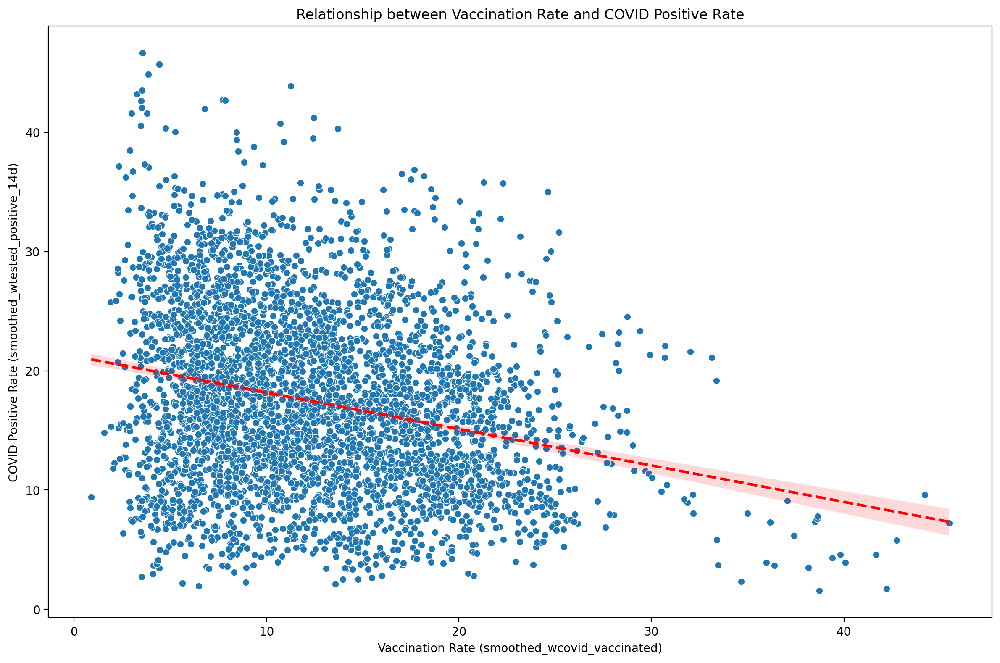

In [ ]:
plt.figure(figsize=(12, 8))
sns.scatterplot(x=df['smoothed_wcovid_vaccinated'], y=df['smoothed_wtested_positive_14d'])
sns.regplot(x=df['smoothed_wcovid_vaccinated'], y=df['smoothed_wtested_positive_14d'],
            scatter=False, color='red', line_kws={"linestyle": "--"})

plt.xlabel('Vaccination Rate (smoothed_wcovid_vaccinated)')
plt.ylabel('COVID Positive Rate (smoothed_wtested_positive_14d)')
plt.title('Relationship between Vaccination Rate and COVID Positive Rate')
plt.tight_layout()
plt.show()
plt.close()

In [ ]:
import scipy.stats as stats

corr, p_value = stats.pearsonr(df['smoothed_wcovid_vaccinated'], df['smoothed_wtested_positive_14d'])

print(f"Pearson correlation coefficient: {corr:.4f}")
print(f"P-value: {p_value:.4e}")

Pearson correlation coefficient: -0.2525
P-value: 1.6835e-57


The scatter plot below shows the relationship between vaccination rates (smoothed_wcovid_vaccinated) and COVID positive rates (smoothed_wtested_positive_14d):

Each point represents a county or region at a specific time point.

The red dashed line shows the fitted linear regression trend.

The downward slope of the regression line suggests a negative relationship between vaccine uptake and COVID positivity rates.

The Pearson correlation analysis yields:

Correlation coefficient (r): -0.2525


Interpretation:
Pearson correlation coefficient: -0.2525

P-value: 1.6835e-57

indicates a weak to moderate negative correlation.

The extremely small p-value indicates that this relationship is statistically significant (p < 0.001).

Thus, higher vaccine uptake is significantly associated with lower COVID positive rates, although the strength of the relationship is moderate.

While the relationship is statistically significant, the correlation is not very strong. This is reasonable because COVID-19 transmission is influenced by multiple factors, including mask-wearing, social behavior, virus variants, and public health interventions, not just vaccination rates alone.


## Basic - train with labeled data

- This section prepares labeled data for modeling by scaling features and splitting into training and testing sets.
- It trains and evaluates five regression models: Linear Regression, Ridge Regression, Random Forest, XGBoost, and Neural Network.
- Each model is tuned with a small hyperparameter grid using cross-validation.
- After training, it collects performance metrics (MSE, RMSE, MAE, R²) for both train/test splits and CV results.
- The script identifies the best-performing models based on Test RMSE and CV RMSE,
- saves the scaler and comparison results, and generates performance comparison plots.


### Data Preparation for Modeling

In [ ]:
# -------------------------------------------------------------------------------
# Data Preparation for Modeling
# -------------------------------------------------------------------------------

print("\n\n" + "="*50)
print("Data Preparation for Modeling")
print("="*50)

# Prepare features and target
X = df[feature_columns]
y = df[target_column]

# Split data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

print(f"Training set: {X_train.shape[0]} samples")
print(f"Testing set: {X_test.shape[0]} samples")

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Save the scaler for future use
joblib.dump(scaler, 'scaler_model.pkl')
print("Feature scaler saved to 'scaler_model.pkl'")



Data Preparation for Modeling
Training set: 3104 samples
Testing set: 776 samples
Feature scaler saved to 'scaler_model.pkl'


In [ ]:
# Function to train and evaluate a model
def train_and_evaluate_model(model, param_grid, model_name):
    # Add this import at the top of your function
    from sklearn.base import clone

    print(f"\nTraining {model_name}...")

    # Set up K-Fold cross-validation
    kf = KFold(n_splits=5, shuffle=True, random_state=42)

    # Set up GridSearchCV
    grid_search = GridSearchCV(
        estimator=model,
        param_grid=param_grid,
        cv=kf,
        scoring='neg_mean_squared_error',
        n_jobs=-1,
        verbose=1,
        return_train_score=True
    )

    # Fit the model
    grid_search.fit(X_train_scaled, y_train)

    # Get the best model
    best_model = grid_search.best_estimator_

    # Save the best model
    model_filename = f"{model_name.lower().replace(' ', '_')}_best_model.pkl"
    joblib.dump(best_model, model_filename)

    # Make predictions
    y_train_pred = best_model.predict(X_train_scaled)
    y_test_pred = best_model.predict(X_test_scaled)

    # Calculate metrics
    train_mse = mean_squared_error(y_train, y_train_pred)
    test_mse = mean_squared_error(y_test, y_test_pred)
    train_rmse = np.sqrt(train_mse)
    test_rmse = np.sqrt(test_mse)
    train_mae = mean_absolute_error(y_train, y_train_pred)
    test_mae = mean_absolute_error(y_test, y_test_pred)
    train_r2 = r2_score(y_train, y_train_pred)
    test_r2 = r2_score(y_test, y_test_pred)

    # Calculate mean and std from cross-validation results for MSE
    cv_results = grid_search.cv_results_
    best_index = grid_search.best_index_
    mean_test_mse = -cv_results['mean_test_score'][best_index]  # Negative because of neg_mean_squared_error
    std_test_mse = cv_results['std_test_score'][best_index]

    # Calculate R² for each fold using the best model
    r2_scores = []
    for train_idx, val_idx in kf.split(X_train_scaled):
        # Split the data
        X_fold_train, X_fold_val = X_train_scaled[train_idx], X_train_scaled[val_idx]
        y_fold_train, y_fold_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

        # Clone the best model and fit it
        fold_model = clone(best_model)
        fold_model.fit(X_fold_train, y_fold_train)

        # Predict and calculate R²
        y_fold_pred = fold_model.predict(X_fold_val)
        r2 = r2_score(y_fold_val, y_fold_pred)
        r2_scores.append(r2)

    # Calculate mean and std of R² scores
    mean_r2 = np.mean(r2_scores)
    std_r2 = np.std(r2_scores)

    # Print results
    print(f"\n{model_name} Results:")
    print(f"Best Parameters: {grid_search.best_params_}")
    print(f"Training MSE: {train_mse:.4f}")
    print(f"Testing MSE: {test_mse:.4f}")
    print(f"Training RMSE: {train_rmse:.4f}")
    print(f"Testing RMSE: {test_rmse:.4f}")
    print(f"Training MAE: {train_mae:.4f}")
    print(f"Testing MAE: {test_mae:.4f}")
    print(f"Training R²: {train_r2:.4f}")
    print(f"Testing R²: {test_r2:.4f}")
    print(f"Cross-validation MSE: {mean_test_mse:.4f} ± {std_test_mse:.4f}")
    print(f"Cross-validation RMSE: {np.sqrt(mean_test_mse):.4f} ± {np.sqrt(std_test_mse/2):.4f}")
    print(f"Cross-validation R²: {mean_r2:.4f} ± {std_r2:.4f}")
    print(f"Model saved as: {model_filename}")

    # Store and return results
    results = {
        'model_name': model_name,
        'best_model': best_model,
        'best_params': grid_search.best_params_,
        'train_mse': train_mse,
        'test_mse': test_mse,
        'train_rmse': train_rmse,
        'test_rmse': test_rmse,
        'train_mae': train_mae,
        'test_mae': test_mae,
        'train_r2': train_r2,
        'test_r2': test_r2,
        'cv_mean_mse': mean_test_mse,
        'cv_std_mse': std_test_mse,
        'cv_mean_rmse': np.sqrt(mean_test_mse),
        'cv_std_rmse': np.sqrt(std_test_mse/2),
        'cv_mean_r2': mean_r2,
        'cv_std_r2': std_r2,
        'model_filename': model_filename
    }

    return results

### Linear Regression

In [ ]:
# -------------------------------------------------------------------------------
# 1. Linear Regression
# -------------------------------------------------------------------------------

# For linear regression, we don't have hyperparameters to tune
linear_model = LinearRegression()
linear_params = {'fit_intercept': [True, False]}

linear_results = train_and_evaluate_model(
    linear_model,
    linear_params,
    "Linear Regression"
)


Training Linear Regression...
Fitting 5 folds for each of 2 candidates, totalling 10 fits

Linear Regression Results:
Best Parameters: {'fit_intercept': True}
Training MSE: 20.1412
Testing MSE: 18.0523
Training RMSE: 4.4879
Testing RMSE: 4.2488
Training MAE: 3.4972
Testing MAE: 3.3502
Training R²: 0.6362
Testing R²: 0.6651
Cross-validation MSE: 20.4417 ± 0.1987
Cross-validation RMSE: 4.5212 ± 0.3152
Cross-validation R²: 0.6296 ± 0.0183
Model saved as: linear_regression_best_model.pkl


### Ridge Regression

In [ ]:
# -------------------------------------------------------------------------------
# 2. Ridge Regression
# -------------------------------------------------------------------------------

ridge_model = Ridge()
ridge_params = {
    'alpha': [0.001, 0.01, 0.1, 1.0, 10.0, 100.0],
    'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']
}

ridge_results = train_and_evaluate_model(
    ridge_model,
    ridge_params,
    "Ridge Regression"
)


Training Ridge Regression...
Fitting 5 folds for each of 42 candidates, totalling 210 fits

Ridge Regression Results:
Best Parameters: {'alpha': 10.0, 'solver': 'lsqr'}
Training MSE: 20.1463
Testing MSE: 18.0773
Training RMSE: 4.4885
Testing RMSE: 4.2517
Training MAE: 3.4972
Testing MAE: 3.3503
Training R²: 0.6361
Testing R²: 0.6646
Cross-validation MSE: 20.4333 ± 0.2069
Cross-validation RMSE: 4.5203 ± 0.3216
Cross-validation R²: 0.6298 ± 0.0180
Model saved as: ridge_regression_best_model.pkl


### Random Forest

In [ ]:
# -------------------------------------------------------------------------------
# 3. Random Forest
# -------------------------------------------------------------------------------

rf_model = RandomForestRegressor(random_state=42)
rf_params = {
    'n_estimators': [50, 100],
    'max_depth': [None, 10],
}

rf_results = train_and_evaluate_model(
    rf_model,
    rf_params,
    "Random Forest"
)


Training Random Forest...
Fitting 5 folds for each of 4 candidates, totalling 20 fits

Random Forest Results:
Best Parameters: {'max_depth': None, 'n_estimators': 100}
Training MSE: 1.2571
Testing MSE: 7.2887
Training RMSE: 1.1212
Testing RMSE: 2.6998
Training MAE: 0.8228
Testing MAE: 2.0247
Training R²: 0.9773
Testing R²: 0.8648
Cross-validation MSE: 10.2687 ± 0.4691
Cross-validation RMSE: 3.2045 ± 0.4843
Cross-validation R²: 0.8139 ± 0.0134
Model saved as: random_forest_best_model.pkl


### XGBoost

In [ ]:
# -------------------------------------------------------------------------------
# 4. XGBoost
# -------------------------------------------------------------------------------

xgb_model = XGBRegressor(random_state=42)
xgb_params = {
    'n_estimators': [50, 100],
    'learning_rate': [0.01, 0.2],
    'max_depth': [3, 7],
}

xgb_results = train_and_evaluate_model(
    xgb_model,
    xgb_params,
    "XGBoost"
)


Training XGBoost...
Fitting 5 folds for each of 8 candidates, totalling 40 fits

XGBoost Results:
Best Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 100}
Training MSE: 0.1638
Testing MSE: 6.3988
Training RMSE: 0.4047
Testing RMSE: 2.5296
Training MAE: 0.2892
Testing MAE: 1.8829
Training R²: 0.9970
Testing R²: 0.8813
Cross-validation MSE: 8.9554 ± 0.6681
Cross-validation RMSE: 2.9926 ± 0.5780
Cross-validation R²: 0.8381 ± 0.0088
Model saved as: xgboost_best_model.pkl


### Neural Network

In [ ]:
# -------------------------------------------------------------------------------
# 5. Neural Network
# -------------------------------------------------------------------------------

nn_model = MLPRegressor(max_iter=1000, random_state=42)
nn_params = {
    'hidden_layer_sizes': [(64, 64), (128, 64), (64, 128, 64)],
    'activation': ['relu'],
    'alpha': [0.0001],
    'learning_rate': ['constant']
}

nn_results = train_and_evaluate_model(
    nn_model,
    nn_params,
    "Neural Network"
)



Training Neural Network...
Fitting 5 folds for each of 3 candidates, totalling 15 fits

Neural Network Results:
Best Parameters: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': (128, 64), 'learning_rate': 'constant'}
Training MSE: 1.4197
Testing MSE: 5.2536
Training RMSE: 1.1915
Testing RMSE: 2.2921
Training MAE: 0.9267
Testing MAE: 1.7643
Training R²: 0.9744
Testing R²: 0.9025
Cross-validation MSE: 6.6956 ± 0.6055
Cross-validation RMSE: 2.5876 ± 0.5502
Cross-validation R²: 0.8785 ± 0.0147
Model saved as: neural_network_best_model.pkl


### Model Comparison



Model Comparison

Model Performance Comparison:
               Model  Train MSE   Test MSE CV MSE (mean ± std)  Train RMSE  \
0  Linear Regression  20.141232  18.052326    20.4417 ± 0.1987    4.487898   
1   Ridge Regression  20.146274  18.077325    20.4333 ± 0.2069    4.488460   
2      Random Forest   1.257089   7.288695    10.2687 ± 0.4691    1.121200   
3            XGBoost   0.163762   6.398782     8.9554 ± 0.6681    0.404676   
4     Neural Network   1.419674   5.253622     6.6956 ± 0.6055    1.191501   

   Test RMSE CV RMSE (mean ± std)  Train MAE  Test MAE  Train R²   Test R²  \
0   4.248803      4.5212 ± 0.3152   3.497176  3.350161  0.636178  0.665052   
1   4.251744      4.5203 ± 0.3216   3.497159  3.350350  0.636087  0.664588   
2   2.699758      3.2045 ± 0.4843   0.822756  2.024748  0.977293  0.864763   
3   2.529581      2.9926 ± 0.5780   0.289194  1.882914  0.997042  0.881275   
4   2.292078      2.5876 ± 0.5502   0.926660  1.764284  0.974356  0.902523   

  CV R² (mea

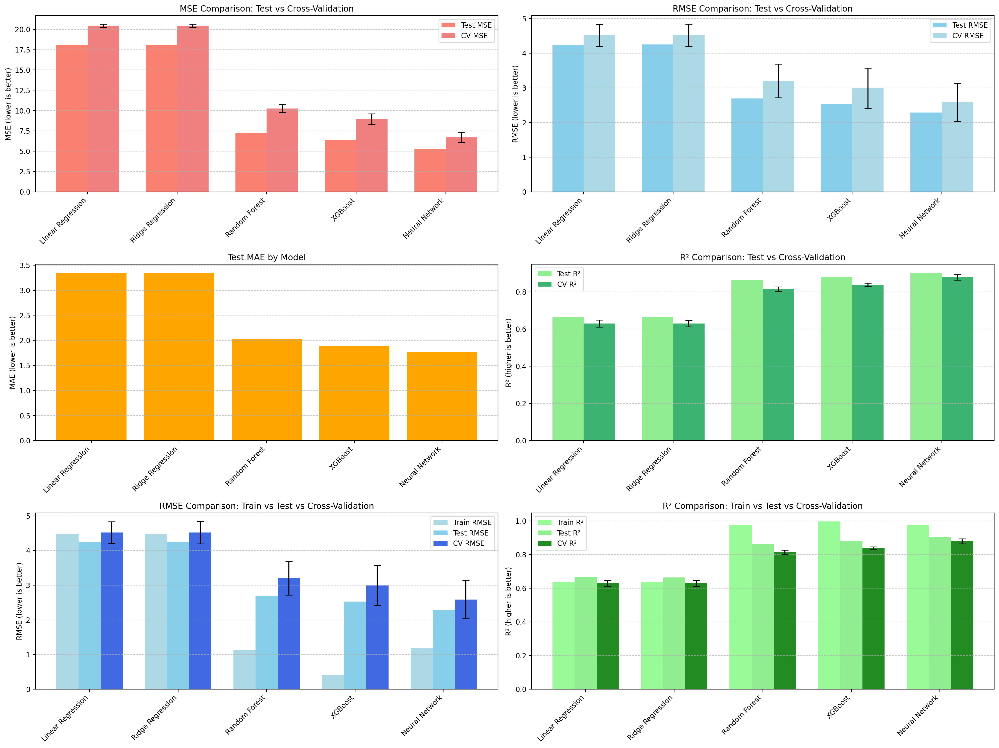

In [ ]:
# -------------------------------------------------------------------------------
# Model Comparison
# -------------------------------------------------------------------------------

print("\n\n" + "="*50)
print("Model Comparison")
print("="*50)

# Collect all results
all_results = [linear_results, ridge_results, rf_results, xgb_results, nn_results]

# Create a comparison dataframe with the new metrics
comparison_df = pd.DataFrame({
    'Model': [result['model_name'] for result in all_results],
    'Train MSE': [result['train_mse'] for result in all_results],
    'Test MSE': [result['test_mse'] for result in all_results],
    'CV MSE (mean ± std)': [f"{result['cv_mean_mse']:.4f} ± {result['cv_std_mse']:.4f}" for result in all_results],
    'Train RMSE': [result['train_rmse'] for result in all_results],
    'Test RMSE': [result['test_rmse'] for result in all_results],
    'CV RMSE (mean ± std)': [f"{result['cv_mean_rmse']:.4f} ± {result['cv_std_rmse']:.4f}" for result in all_results],
    'Train MAE': [result['train_mae'] for result in all_results],
    'Test MAE': [result['test_mae'] for result in all_results],
    'Train R²': [result['train_r2'] for result in all_results],
    'Test R²': [result['test_r2'] for result in all_results],
    'CV R² (mean ± std)': [f"{result['cv_mean_r2']:.4f} ± {result['cv_std_r2']:.4f}" for result in all_results]
})

print("\nModel Performance Comparison:")
print(comparison_df)

# Create a numeric dataframe for plotting and finding the best model
numeric_df = pd.DataFrame({
    'Model': [result['model_name'] for result in all_results],
    'Train MSE': [result['train_mse'] for result in all_results],
    'Test MSE': [result['test_mse'] for result in all_results],
    'CV MSE Mean': [result['cv_mean_mse'] for result in all_results],
    'CV MSE Std': [result['cv_std_mse'] for result in all_results],
    'Train RMSE': [result['train_rmse'] for result in all_results],
    'Test RMSE': [result['test_rmse'] for result in all_results],
    'CV RMSE Mean': [result['cv_mean_rmse'] for result in all_results],
    'CV RMSE Std': [result['cv_std_rmse'] for result in all_results],
    'Train MAE': [result['train_mae'] for result in all_results],
    'Test MAE': [result['test_mae'] for result in all_results],
    'Train R²': [result['train_r2'] for result in all_results],
    'Test R²': [result['test_r2'] for result in all_results],
    'CV R² Mean': [result['cv_mean_r2'] for result in all_results],
    'CV R² Std': [result['cv_std_r2'] for result in all_results]
})

# Find the best model based on test RMSE
best_model_idx = np.argmin(numeric_df['Test RMSE'])
best_model_result = all_results[best_model_idx]
print(f"\nBest model based on Test RMSE: {best_model_result['model_name']}")
print(f"Best model file: {best_model_result['model_filename']}")

# Find the best model based on CV RMSE
best_cv_model_idx = np.argmin(numeric_df['CV RMSE Mean'])
best_cv_model_result = all_results[best_cv_model_idx]
print(f"\nBest model based on CV RMSE: {best_cv_model_result['model_name']}")
print(f"Best CV model file: {best_cv_model_result['model_filename']}")

# Save comparison results to CSV
comparison_df.to_csv('model_comparison_results.csv', index=False)
print("Model comparison saved to 'model_comparison_results.csv'")

# Create performance comparison visualizations
plt.figure(figsize=(20, 15))

# MSE Comparison - Test vs CV
plt.subplot(3, 2, 1)
x = np.arange(len(numeric_df['Model']))
width = 0.35
plt.bar(x - width/2, numeric_df['Test MSE'], width, label='Test MSE', color='salmon')
plt.bar(x + width/2, numeric_df['CV MSE Mean'], width, label='CV MSE', color='lightcoral')
plt.errorbar(x + width/2, numeric_df['CV MSE Mean'], yerr=numeric_df['CV MSE Std'],
             fmt='none', ecolor='black', capsize=5)
plt.title('MSE Comparison: Test vs Cross-Validation')
plt.ylabel('MSE (lower is better)')
plt.xticks(x, numeric_df['Model'], rotation=45, ha='right')
plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.legend()

# RMSE Comparison - Test vs CV
plt.subplot(3, 2, 2)
plt.bar(x - width/2, numeric_df['Test RMSE'], width, label='Test RMSE', color='skyblue')
plt.bar(x + width/2, numeric_df['CV RMSE Mean'], width, label='CV RMSE', color='lightblue')
plt.errorbar(x + width/2, numeric_df['CV RMSE Mean'], yerr=numeric_df['CV RMSE Std'],
             fmt='none', ecolor='black', capsize=5)
plt.title('RMSE Comparison: Test vs Cross-Validation')
plt.ylabel('RMSE (lower is better)')
plt.xticks(x, numeric_df['Model'], rotation=45, ha='right')
plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.legend()

# MAE Comparison
plt.subplot(3, 2, 3)
plt.bar(x, numeric_df['Test MAE'], color='orange')
plt.title('Test MAE by Model')
plt.ylabel('MAE (lower is better)')
plt.xticks(x, numeric_df['Model'], rotation=45, ha='right')
plt.grid(True, axis='y', linestyle='--', alpha=0.7)

# R² Comparison - Test vs CV
plt.subplot(3, 2, 4)
plt.bar(x - width/2, numeric_df['Test R²'], width, label='Test R²', color='lightgreen')
plt.bar(x + width/2, numeric_df['CV R² Mean'], width, label='CV R²', color='mediumseagreen')
plt.errorbar(x + width/2, numeric_df['CV R² Mean'], yerr=numeric_df['CV R² Std'],
             fmt='none', ecolor='black', capsize=5)
plt.title('R² Comparison: Test vs Cross-Validation')
plt.ylabel('R² (higher is better)')
plt.xticks(x, numeric_df['Model'], rotation=45, ha='right')
plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.legend()

# Train vs Test vs CV RMSE
plt.subplot(3, 2, 5)
width = 0.25
plt.bar(x - width, numeric_df['Train RMSE'], width, label='Train RMSE', color='lightblue')
plt.bar(x, numeric_df['Test RMSE'], width, label='Test RMSE', color='skyblue')
plt.bar(x + width, numeric_df['CV RMSE Mean'], width, label='CV RMSE', color='royalblue')
plt.errorbar(x + width, numeric_df['CV RMSE Mean'], yerr=numeric_df['CV RMSE Std'],
             fmt='none', ecolor='black', capsize=5)
plt.title('RMSE Comparison: Train vs Test vs Cross-Validation')
plt.ylabel('RMSE (lower is better)')
plt.xticks(x, numeric_df['Model'], rotation=45, ha='right')
plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.legend()

# Train vs Test vs CV R²
plt.subplot(3, 2, 6)
plt.bar(x - width, numeric_df['Train R²'], width, label='Train R²', color='palegreen')
plt.bar(x, numeric_df['Test R²'], width, label='Test R²', color='lightgreen')
plt.bar(x + width, numeric_df['CV R² Mean'], width, label='CV R²', color='forestgreen')
plt.errorbar(x + width, numeric_df['CV R² Mean'], yerr=numeric_df['CV R² Std'],
             fmt='none', ecolor='black', capsize=5)
plt.title('R² Comparison: Train vs Test vs Cross-Validation')
plt.ylabel('R² (higher is better)')
plt.xticks(x, numeric_df['Model'], rotation=45, ha='right')
plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.legend()

plt.tight_layout()
plt.savefig('model_comparison.png')
plt.show()
plt.close()

### Model Performance Comparison

| Model               | Train RMSE ↓ | Test RMSE ↓ | CV RMSE (mean ± std) ↓ | Train R² ↑ | Test R² ↑ | CV R² (mean ± std) ↑ |
|:--------------------|-------------:|------------:|:-----------------------|-----------:|----------:|:---------------------|
| Linear Regression   | 4.488         | 4.249       | 4.5212 ± 0.3152         | 0.636      | 0.665     | 0.6296 ± 0.0183       |
| Ridge Regression    | 4.488         | 4.252       | 4.5203 ± 0.3216         | 0.636      | 0.665     | 0.6298 ± 0.0180       |
| Random Forest       | 1.121         | 2.700       | 3.2045 ± 0.4843         | 0.977      | 0.865     | 0.8139 ± 0.0134       |
| XGBoost             | **0.405**  | 2.530       | 2.9926 ± 0.5780         | **0.997** | 0.881     | 0.8381 ± 0.0088       |
| Neural Network      | 1.192         | **2.292** | **2.5876 ± 0.5502**   | 0.974      | **0.903** | **0.8785 ± 0.0147** |

---

### Brief Analysis Report

In this model comparison, five regression models (Linear Regression, Ridge Regression, Random Forest, XGBoost, and Neural Network) were evaluated based on training error, testing error, and cross-validation performance.

- **Neural Network** achieved the best performance, with the lowest Test MSE (5.254) and Test RMSE (2.292). It also achieved the best cross-validation results (CV MSE: 6.6956, CV RMSE: 2.5876).  
  The R² score reached 0.903 on the test set and averaged 0.8785 during cross-validation, indicating excellent fitting and generalization ability.
- **XGBoost** followed closely, with a Test MSE of 6.399 and a Test RMSE of 2.530. It also demonstrated stable cross-validation results (CV MSE: 8.9554, CV RMSE: 2.9926), making it suitable for scenarios requiring stronger fitting to the training data.
- **Random Forest** had a very low training error (Train MSE: 1.257), but its testing and cross-validation errors were higher, showing signs of **overfitting**.
- **Linear Regression** and **Ridge Regression** performed similarly, but their testing errors were significantly larger (Test MSE around 18), and R² scores were around 0.665, indicating that simple linear relationships were insufficient to capture the data patterns.

Considering Test MSE, RMSE, and R² across both testing and cross-validation, **the Neural Network was selected as the final best model**.


### Actual vs Predicted Plot for Best Model



Actual vs Predicted Plot for Best Model


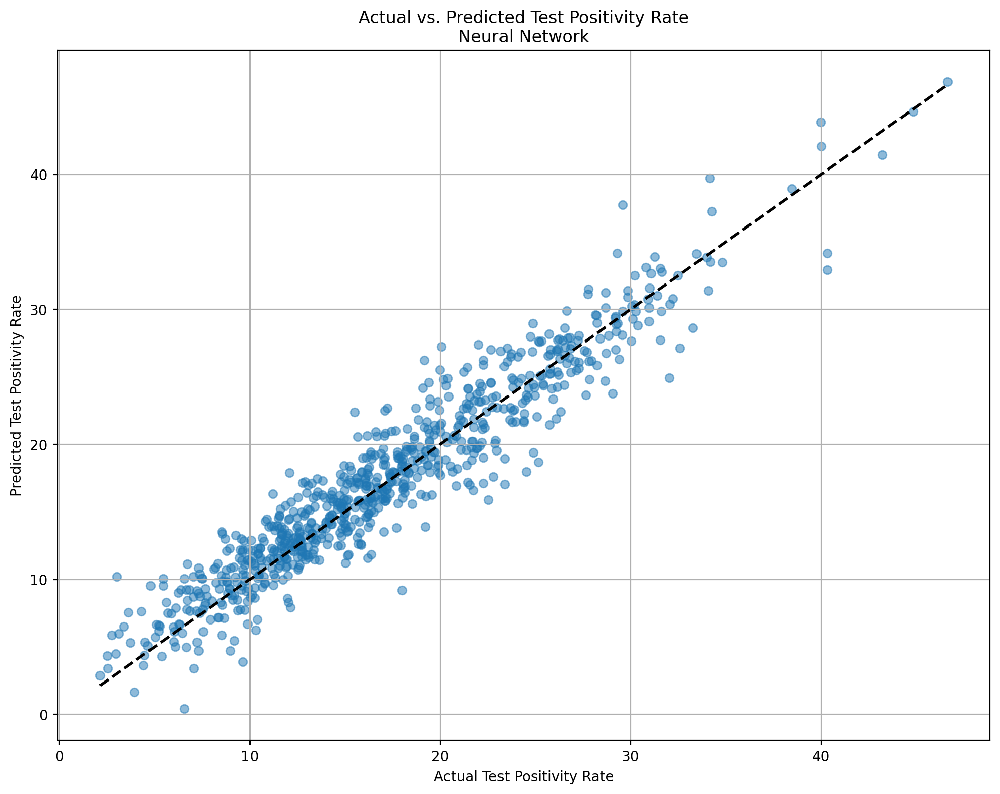

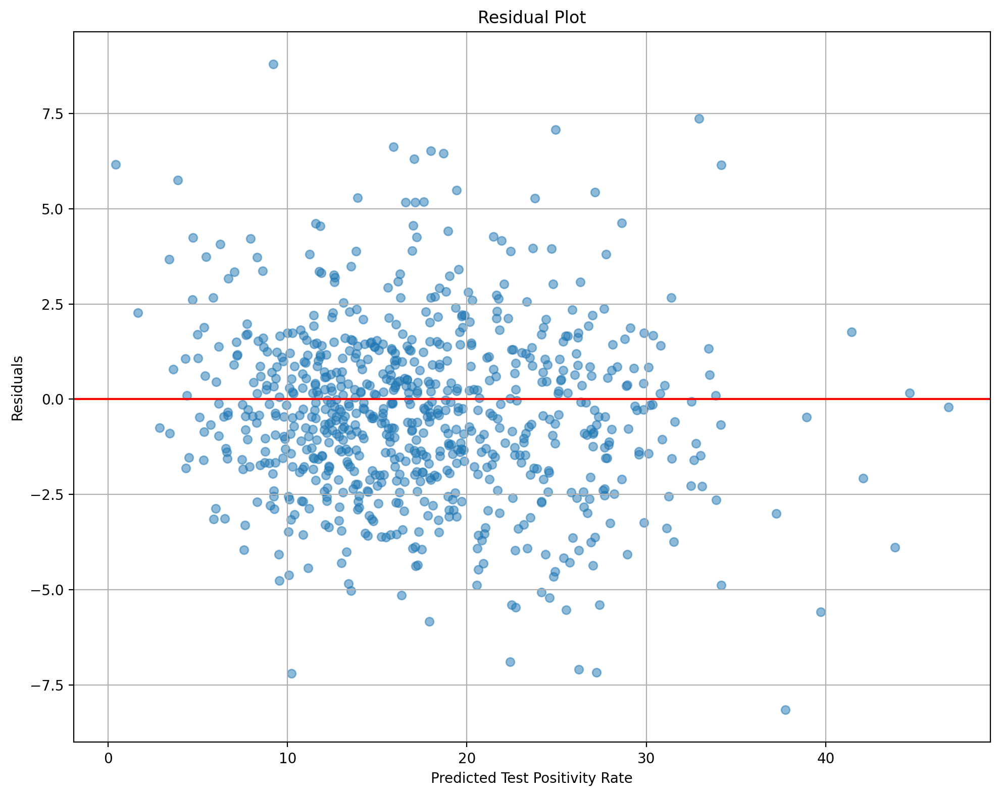

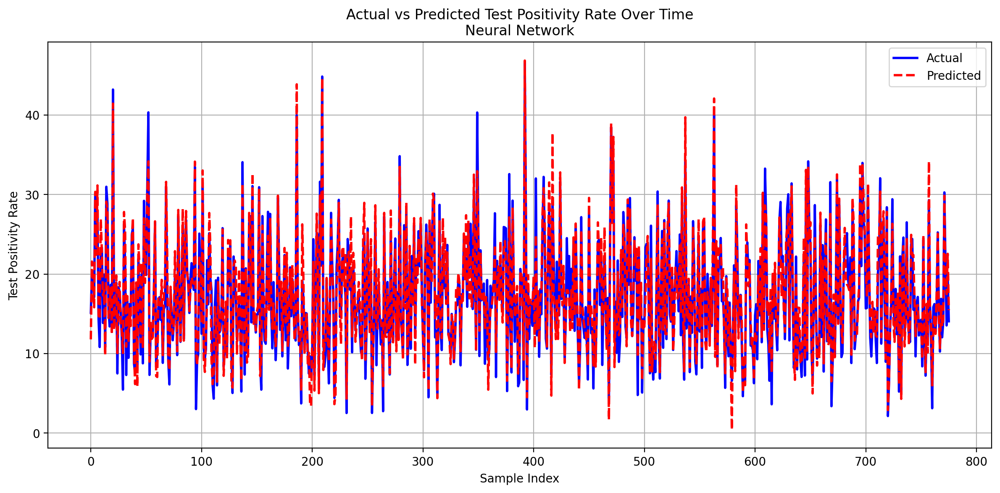

Actual vs Predicted analysis completed. Visualizations saved.


Analysis Completed

Summary:
- Best performing model: Neural Network
- Test MSE: 5.2536
- Test RMSE: 2.2921
- Test R²: 0.9025

All models, results, and visualizations have been saved.


In [ ]:
# -------------------------------------------------------------------------------
# Actual vs Predicted Plot for Best Model
# -------------------------------------------------------------------------------

print("\n\n" + "="*50)
print("Actual vs Predicted Plot for Best Model")
print("="*50)

# Load the best model
best_model = joblib.load(best_model_result['model_filename'])

# Make predictions
y_test_pred = best_model.predict(X_test_scaled)

# Create actual vs predicted scatter plot
plt.figure(figsize=(10, 8))
plt.scatter(y_test, y_test_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xlabel('Actual Test Positivity Rate')
plt.ylabel('Predicted Test Positivity Rate')
plt.title(f'Actual vs. Predicted Test Positivity Rate\n{best_model_result["model_name"]}')
plt.grid(True)
plt.tight_layout()
plt.savefig('actual_vs_predicted_scatter.png')
plt.show()
plt.close()

# Create residual plot
residuals = y_test - y_test_pred
plt.figure(figsize=(10, 8))
plt.scatter(y_test_pred, residuals, alpha=0.5)
plt.axhline(y=0, color='r', linestyle='-')
plt.xlabel('Predicted Test Positivity Rate')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.grid(True)
plt.tight_layout()
plt.savefig('residual_plot.png')
plt.show()
plt.close()

# Create time series plot of actual vs predicted values sorted by date
plt.figure(figsize=(12, 6))

# If you have a separate date column in your test data
# Assuming X_test has a 'date' column or similar
if 'date' in X_test.columns:
    # Create a DataFrame with dates, actual values, and predictions
    result_df = pd.DataFrame({
        'date': X_test['date'],
        'actual': y_test,
        'predicted': y_test_pred
    })

    # Sort by date
    result_df = result_df.sort_values('date')

    # Plot
    plt.plot(result_df['date'], result_df['actual'], 'b-', label='Actual', linewidth=2)
    plt.plot(result_df['date'], result_df['predicted'], 'r--', label='Predicted', linewidth=2)

    # Format x-axis for dates
    plt.gcf().autofmt_xdate()

# If the index of y_test is already a DatetimeIndex
elif isinstance(y_test.index, pd.DatetimeIndex):
    # Create a DataFrame with the data
    result_df = pd.DataFrame({
        'actual': y_test,
        'predicted': y_test_pred
    })

    # Sort by index (which is a DatetimeIndex)
    result_df = result_df.sort_index()

    # Plot
    plt.plot(result_df.index, result_df['actual'], 'b-', label='Actual', linewidth=2)
    plt.plot(result_df.index, result_df['predicted'], 'r--', label='Predicted', linewidth=2)

    # Format x-axis for dates
    plt.gcf().autofmt_xdate()

# If you need to create a date column from another source (e.g., a separate DataFrame with dates)
else:
    # If no date information is available, use sequence
    plt.plot(range(len(y_test)), y_test, 'b-', label='Actual', linewidth=2)
    plt.plot(range(len(y_test_pred)), y_test_pred, 'r--', label='Predicted', linewidth=2)
    plt.xlabel('Sample Index')

plt.title(f'Actual vs Predicted Test Positivity Rate Over Time\n{best_model_result["model_name"]}')
plt.ylabel('Test Positivity Rate')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig('actual_vs_predicted_timeseries.png', dpi=300)
plt.show()
plt.close()

print("Actual vs Predicted analysis completed. Visualizations saved.")

print("\n\n" + "="*50)
print("Analysis Completed")
print("="*50)
print("\nSummary:")
print(f"- Best performing model: {best_model_result['model_name']}")
print(f"- Test MSE: {best_model_result['test_mse']:.4f}")
print(f"- Test RMSE: {best_model_result['test_rmse']:.4f}")
print(f"- Test R²: {best_model_result['test_r2']:.4f}")
print("\nAll models, results, and visualizations have been saved.")

### Feature Importance Analysis Across Models

- This section performs feature importance analysis for all trained models,
- including the Linear Model (Ridge Regression), Random Forest, XGBoost, and Neural Network.

- For linear and tree-based models, feature importances are based on coefficients or built-in importance scores.


- For the Neural Network, SHAP (SHapley Additive exPlanations) values are used to interpret feature contributions.

Both individual feature importance and grouped feature importance (Behavioral, Belief, COVID Activity) are visualized for better understanding.

Finally, a cross-model comparison of feature importances is conducted to highlight the top features shared across models.


In [ ]:
# Group features by category for better visualization
feature_groups = {
    'Behavioral': [col for col in feature_columns if any(x in col for x in ['mask', 'outside', 'event', 'restaurant', 'shop', 'time', 'transit'])],
    'Belief': [col for col in feature_columns if any(x in col for x in ['worried', 'vaccine', 'likely'])],
    'COVID Activity': [col for col in feature_columns if any(x in col for x in ['cli', 'tested', 'confirmed', 'vaccinated'])]
}



Feature Importance Analysis for Linear Model

Linear Model Feature ranking:
4. smoothed_wcovid_vaccinated_or_accept (2.5295)
9. smoothed_wothers_masked (2.4456)
10. smoothed_wcli (2.2767)
6. smoothed_wvaccine_likely_govt_health (2.2721)
16. smoothed_wwearing_mask (2.0151)
5. smoothed_wworried_become_ill (1.9411)
3. smoothed_wpublic_transit_1d (1.6757)
12. smoothed_wvaccine_likely_friends (1.3201)
15. smoothed_wvaccine_likely_who (1.2624)
2. smoothed_wtested_14d (1.0983)
13. smoothed_wrestaurant_1d (1.0957)
14. smoothed_wvaccine_likely_politicians (0.9493)
1. smoothed_wspent_time_1d (0.7606)
11. smoothed_wcovid_vaccinated (0.6975)
17. smoothed_wlarge_event_1d (0.6432)


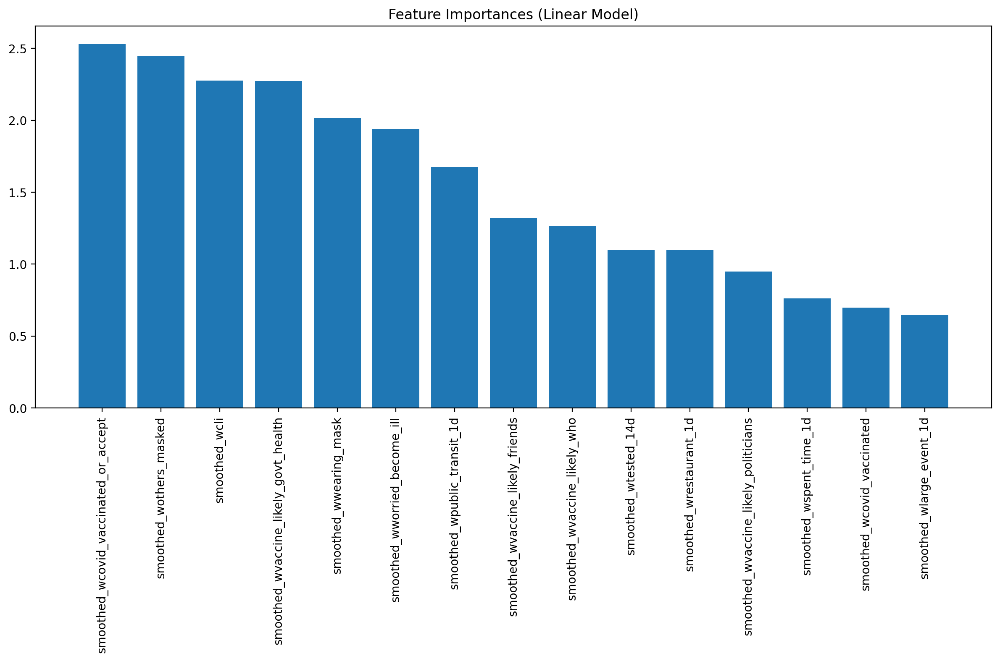

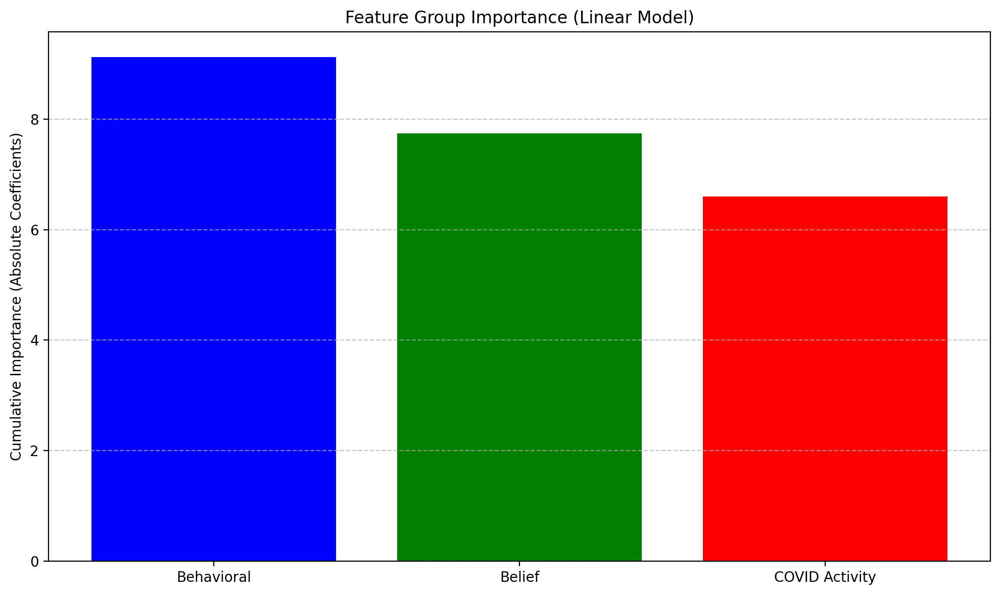


Linear Model Feature importance analysis completed. Visualizations saved.


In [ ]:
# -------------------------------------------------------------------------------
# Feature Importance Analysis for Linear Model
# -------------------------------------------------------------------------------

print("\n\n" + "="*50)
print("Feature Importance Analysis for Linear Model")
print("="*50)

# Load the best Linear model (Ridge, Lasso, or Linear Regression)
linear_model = joblib.load(ridge_results['model_filename'])  # Assuming Ridge is the best linear model

# Get feature coefficients (absolute values for importance)
coef = np.abs(linear_model.coef_)
linear_importance = pd.DataFrame({
    'Feature': feature_columns,
    'Coefficient': coef
})

# Sort by importance
linear_importance = linear_importance.sort_values('Coefficient', ascending=False)

# Print feature ranking
print("\nLinear Model Feature ranking:")
for i, row in linear_importance.head(15).iterrows():
    print(f"{i+1}. {row['Feature']} ({row['Coefficient']:.4f})")

# Create feature importance visualization
plt.figure(figsize=(12, 8))
plt.title("Feature Importances (Linear Model)")
plt.bar(x=range(len(linear_importance.head(15))), height=linear_importance.head(15)['Coefficient'])
plt.xticks(range(len(linear_importance.head(15))), linear_importance.head(15)['Feature'], rotation=90)
plt.tight_layout()
plt.show()
plt.savefig('linear_feature_importance.png')
plt.close()

# Group features by category for better visualization
linear_group_importance = {}
for group_name, group_features in feature_groups.items():
    group_coefs = [coef[list(feature_columns).index(feature)] for feature in group_features]
    linear_group_importance[group_name] = sum(group_coefs)

# Create group importance visualization
plt.figure(figsize=(10, 6))
plt.title("Feature Group Importance (Linear Model)")
plt.bar(linear_group_importance.keys(), linear_group_importance.values(), color=['blue', 'green', 'red'])
plt.ylabel('Cumulative Importance (Absolute Coefficients)')
plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()
plt.savefig('linear_group_importance.png')
plt.close()

print("\nLinear Model Feature importance analysis completed. Visualizations saved.")

**Insights** :The most influential factors in the linear model are vaccination acceptance, mask-wearing behaviors (both personal and community), and COVID-like illness indicators. Beliefs about vaccine efficacy from government sources are also highly impactful.



Feature Importance Analysis for Random Forest

Feature ranking:
1. smoothed_wcli (0.3694)
2. smoothed_wpublic_transit_1d (0.0728)
3. smoothed_wcovid_vaccinated_or_accept (0.0661)
4. smoothed_wlarge_event_1d (0.0656)
5. smoothed_wothers_masked (0.0640)
6. smoothed_wworried_become_ill (0.0510)
7. smoothed_wcovid_vaccinated (0.0429)
8. smoothed_wrestaurant_1d (0.0415)
9. smoothed_wtested_14d (0.0377)
10. smoothed_wvaccine_likely_politicians (0.0317)
11. smoothed_wwork_outside_home_1d (0.0251)
12. smoothed_wvaccine_likely_friends (0.0248)
13. smoothed_wshop_1d (0.0231)
14. smoothed_wspent_time_1d (0.0187)
15. diff_days (0.0174)
16. smoothed_wwearing_mask (0.0165)
17. smoothed_wvaccine_likely_govt_health (0.0162)
18. smoothed_wvaccine_likely_who (0.0154)


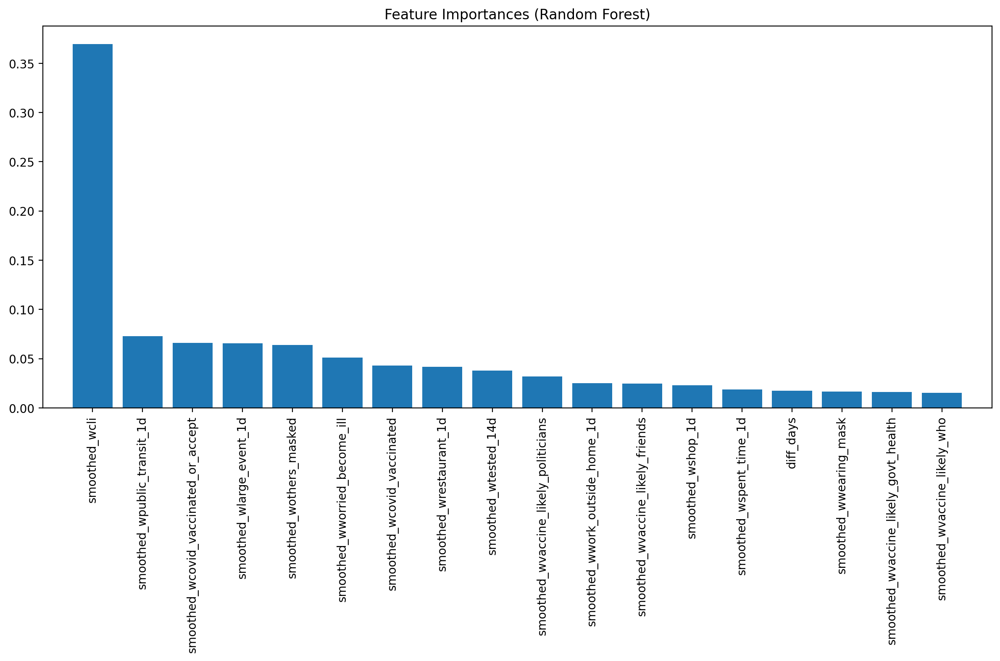

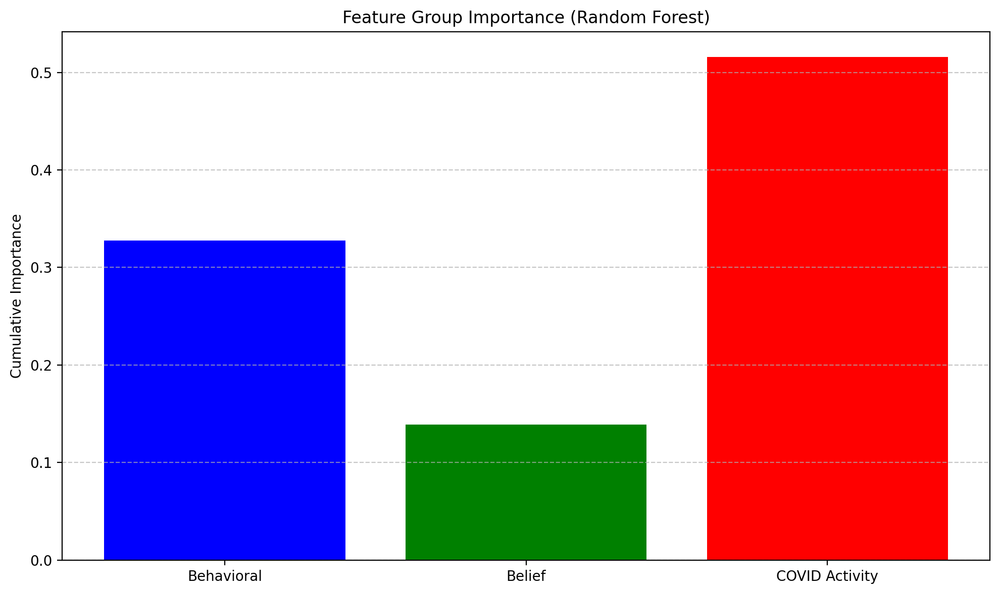


Feature importance analysis completed. Visualizations saved.


In [ ]:
# -------------------------------------------------------------------------------
# Feature Importance Analysis for Random Forest
# -------------------------------------------------------------------------------

print("\n\n" + "="*50)
print("Feature Importance Analysis for Random Forest")
print("="*50)

# Load the best Random Forest model
rf_model = joblib.load(rf_results['model_filename'])

# Get feature importances
importances = rf_model.feature_importances_
indices = np.argsort(importances)[::-1]

# Print feature ranking
print("\nFeature ranking:")
for i in range(len(feature_columns)):
    print(f"{i+1}. {feature_columns[indices[i]]} ({importances[indices[i]]:.4f})")

# Create feature importance visualization
plt.figure(figsize=(12, 8))
plt.title("Feature Importances (Random Forest)")
plt.bar(range(X.shape[1]), importances[indices], align="center")
plt.xticks(range(X.shape[1]), [feature_columns[i] for i in indices], rotation=90)
plt.xlim([-1, X.shape[1]])
plt.tight_layout()
plt.show()
plt.savefig('rf_feature_importance.png')
plt.close()

# Calculate importance by group
group_importance = {}
for group_name, group_features in feature_groups.items():
    group_importance[group_name] = sum(importances[list(feature_columns).index(feature)] for feature in group_features)

# Create group importance visualization
plt.figure(figsize=(10, 6))
plt.title("Feature Group Importance (Random Forest)")
plt.bar(group_importance.keys(), group_importance.values(), color=['blue', 'green', 'red'])
plt.ylabel('Cumulative Importance')
plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()
plt.savefig('rf_group_importance.png')
plt.close()

print("\nFeature importance analysis completed. Visualizations saved.")

**Insights** : Random Forest highlights the same strong role of COVID-like illness symptoms (smoothed_wcli) and also suggests that behaviors such as public transit usage and attending large events negatively or positively affect predictions.



Feature Importance Analysis for XGBoost

XGBoost Feature ranking:
10. smoothed_wcli (0.3683)
17. smoothed_wlarge_event_1d (0.0948)
9. smoothed_wothers_masked (0.0655)
4. smoothed_wcovid_vaccinated_or_accept (0.0581)
3. smoothed_wpublic_transit_1d (0.0574)
5. smoothed_wworried_become_ill (0.0557)
13. smoothed_wrestaurant_1d (0.0420)
11. smoothed_wcovid_vaccinated (0.0418)
14. smoothed_wvaccine_likely_politicians (0.0348)
12. smoothed_wvaccine_likely_friends (0.0269)
18. diff_days (0.0268)
2. smoothed_wtested_14d (0.0258)
8. smoothed_wwork_outside_home_1d (0.0245)
7. smoothed_wshop_1d (0.0206)
15. smoothed_wvaccine_likely_who (0.0179)


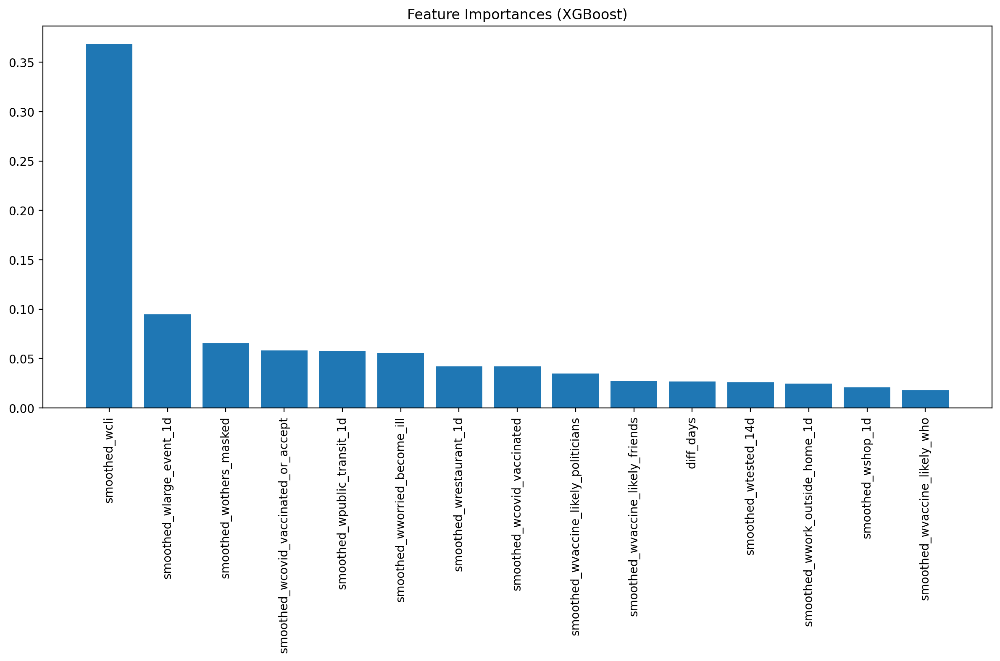

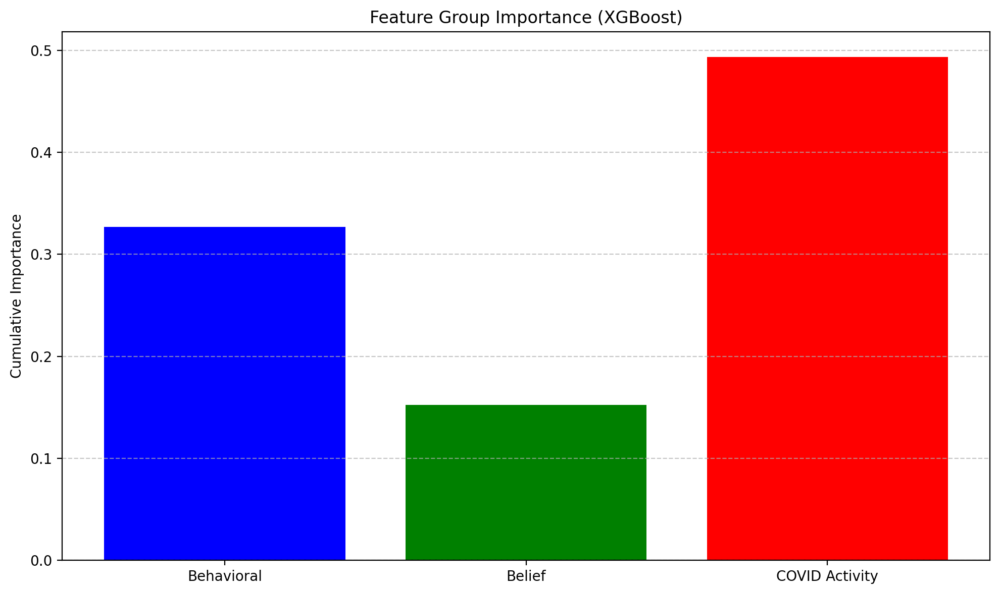


XGBoost Feature importance analysis completed. Visualizations saved.


In [ ]:
# -------------------------------------------------------------------------------
# Feature Importance Analysis for XGBoost
# -------------------------------------------------------------------------------

print("\n\n" + "="*50)
print("Feature Importance Analysis for XGBoost")
print("="*50)

# Load the best XGBoost model
xgb_model = joblib.load(xgb_results['model_filename'])

# Get feature importances
xgb_importances = xgb_model.feature_importances_
xgb_importance_df = pd.DataFrame({
    'Feature': feature_columns,
    'Importance': xgb_importances
})

# Sort by importance
xgb_importance_df = xgb_importance_df.sort_values('Importance', ascending=False)

# Print feature ranking
print("\nXGBoost Feature ranking:")
for i, row in xgb_importance_df.head(15).iterrows():
    print(f"{i+1}. {row['Feature']} ({row['Importance']:.4f})")

# Create feature importance visualization
plt.figure(figsize=(12, 8))
plt.title("Feature Importances (XGBoost)")
plt.bar(x=range(len(xgb_importance_df.head(15))), height=xgb_importance_df.head(15)['Importance'])
plt.xticks(range(len(xgb_importance_df.head(15))), xgb_importance_df.head(15)['Feature'], rotation=90)
plt.tight_layout()
plt.show()
plt.savefig('xgb_feature_importance.png')
plt.close()

# Group features by category for better visualization
xgb_group_importance = {}
for group_name, group_features in feature_groups.items():
    group_importances = [xgb_importances[list(feature_columns).index(feature)] for feature in group_features]
    xgb_group_importance[group_name] = sum(group_importances)

# Create group importance visualization
plt.figure(figsize=(10, 6))
plt.title("Feature Group Importance (XGBoost)")
plt.bar(xgb_group_importance.keys(), xgb_group_importance.values(), color=['blue', 'green', 'red'])
plt.ylabel('Cumulative Importance')
plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()
plt.savefig('xgb_group_importance.png')
plt.close()

print("\nXGBoost Feature importance analysis completed. Visualizations saved.")

**Insights** :
XGBoost further confirms the importance of illness indicators and mask-related behaviors. It also places high importance on participation in large events.



Comparing Feature Importance Across Models


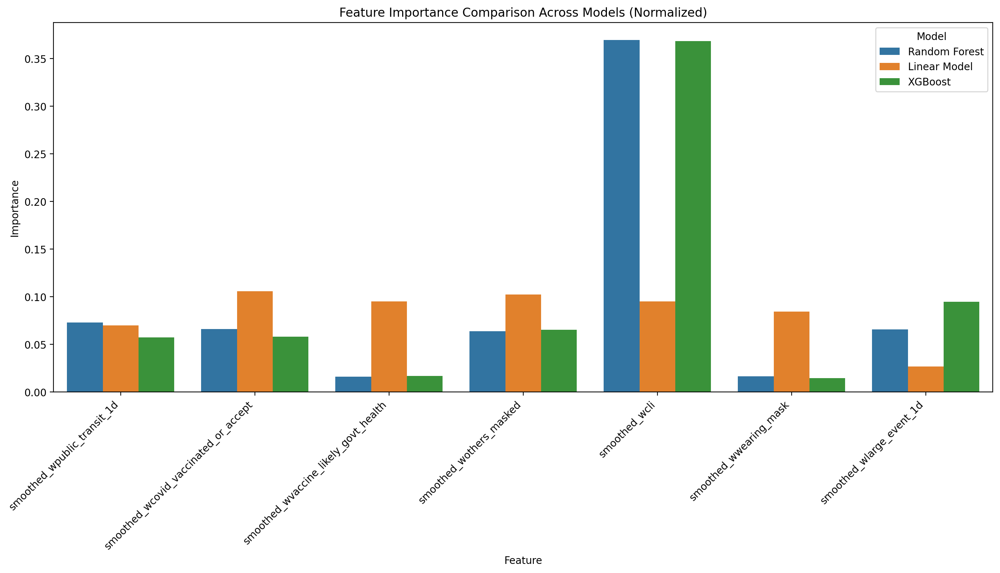


Top 10 important features across all models:
- smoothed_wcli
- smoothed_wpublic_transit_1d
- smoothed_wcovid_vaccinated_or_accept
- smoothed_wlarge_event_1d
- smoothed_wothers_masked
- smoothed_wvaccine_likely_govt_health
- smoothed_wwearing_mask

Feature importance comparison completed. Visualizations saved.


In [ ]:
# -------------------------------------------------------------------------------
# Comparing Feature Importance Across Models
# -------------------------------------------------------------------------------

print("\n\n" + "="*50)
print("Comparing Feature Importance Across Models")
print("="*50)

# Normalize importance scores for fair comparison
rf_importance_norm = importances / np.sum(importances)
linear_importance_norm = coef / np.sum(coef)
xgb_importance_norm = xgb_importances / np.sum(xgb_importances)

# Create a DataFrame with all model importances
importance_comparison = pd.DataFrame({
    'Feature': feature_columns,
    'Random Forest': rf_importance_norm,
    'Linear Model': linear_importance_norm,
    'XGBoost': xgb_importance_norm
})

# Get the top 10 most important features across all models
top_features_all_models = []
for model in ['Random Forest', 'Linear Model', 'XGBoost']:
    # Get top 5 features from each model
    top_model_features = importance_comparison.sort_values(model, ascending=False)['Feature'].head(5).tolist()
    top_features_all_models.extend(top_model_features)

# Remove duplicates while preserving order
top_features_all_models = list(dict.fromkeys(top_features_all_models))
top_features_all_models = top_features_all_models[:10]  # Limit to 10 features

# Filter comparison DataFrame to show only top features
top_importance_comparison = importance_comparison[importance_comparison['Feature'].isin(top_features_all_models)]

# Reshape for plotting
plot_data = pd.melt(
    top_importance_comparison,
    id_vars=['Feature'],
    value_vars=['Random Forest', 'Linear Model', 'XGBoost'],
    var_name='Model',
    value_name='Importance'
)

# Create comparison visualization
plt.figure(figsize=(14, 8))
sns.barplot(x='Feature', y='Importance', hue='Model', data=plot_data)
plt.title('Feature Importance Comparison Across Models (Normalized)')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Model')
plt.tight_layout()
plt.show()
plt.savefig('feature_importance_comparison.png')
plt.close()

print("\nTop 10 important features across all models:")
for feature in top_features_all_models:
    print(f"- {feature}")

print("\nFeature importance comparison completed. Visualizations saved.")

  0%|          | 0/100 [00:00<?, ?it/s]

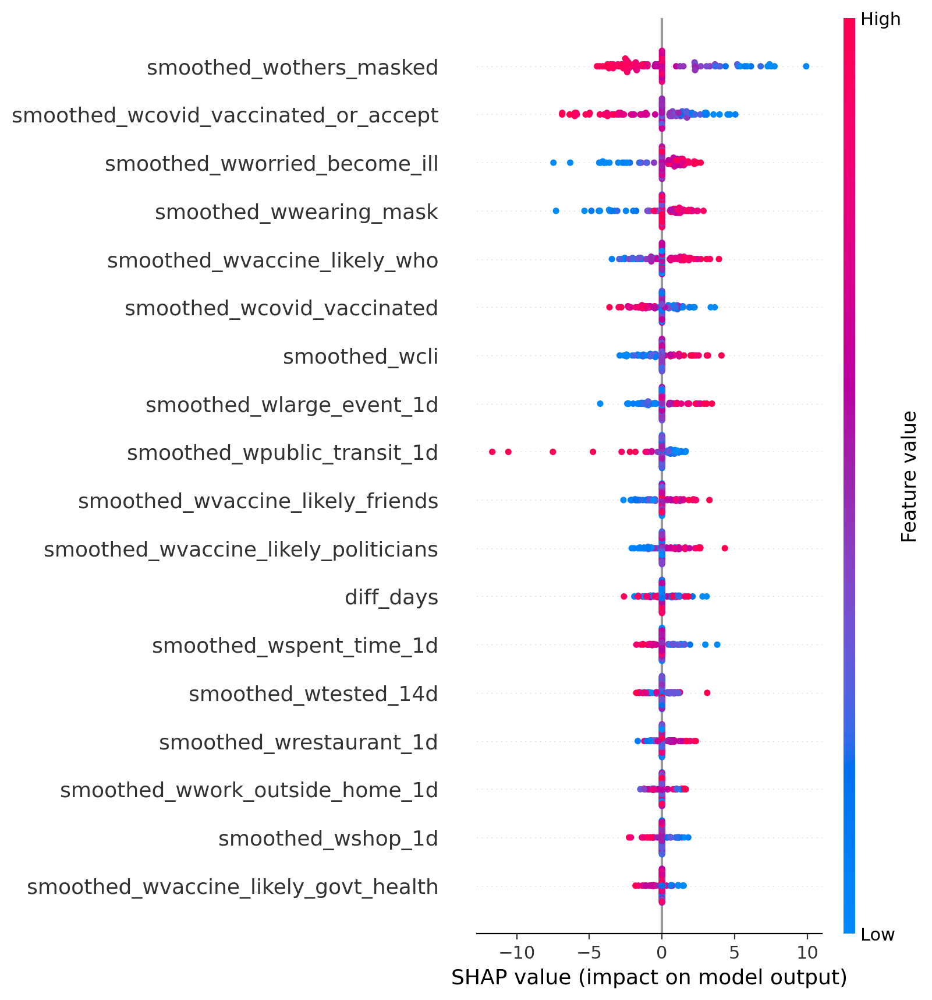

<Figure size 640x480 with 0 Axes>

In [ ]:
# -------------------------------------------------------------------------------
# Feature Importance Analysis for NN
# -------------------------------------------------------------------------------
def calculate_nn_shap_values(model, X, feature_names=None):
    """
    Calculate SHAP values for a neural network model.

    Parameters:
    -----------
    model : trained neural network model
    X : feature dataset
    feature_names : list of feature names (optional)

    Returns:
    --------
    SHAP values and summary plot
    """
    import shap

    # If feature names not provided, create default ones
    if feature_names is None:
        feature_names = [f'Feature {i}' for i in range(X.shape[1])]

    # Create a SHAP explainer
    explainer = shap.KernelExplainer(model.predict, X[:50])  # Use a subset for background

    # Calculate SHAP values
    shap_values = explainer.shap_values(X[:100])  # Use a subset to speed up calculation

    # Create summary plot
    plt.figure(figsize=(10, 8))
    shap.summary_plot(shap_values, X[:100], feature_names=feature_names)
    plt.tight_layout()
    plt.savefig('nn_shap_feature_importance.png')

    # Return SHAP values for further analysis
    return shap_values

# Use the function with your neural network model
nn_shap_values = calculate_nn_shap_values(
    nn_results['best_model'],  # Your trained NN model
    X_test_scaled,             # Test features
    X_test.columns             # Feature names
)

This SHAP value plot reveals the impact of various COVID-19 related behaviors and attitudes on the model's prediction. Features related to mask-wearing show significant influence, with "smoothed_wothers_masked" (others wearing masks) demonstrating strong positive impact when values are high, suggesting that perceived community masking behaviors substantially increase the model's prediction. Similarly, "smoothed_wcovid_vaccinated_or_accept" shows that higher vaccination acceptance correlates with positive prediction outcomes. Interestingly, worry about illness ("smoothed_wworried_become_ill") displays a mixed effect—higher worry levels generally increase predictions, while lower levels decrease them. Features related to public activities like "smoothed_wpublic_transit_1d" show predominantly negative effects when values are high, indicating that frequent public transit use reduces predicted values. The variable "smoothed_wcli" (possibly COVID-like illness indicators) demonstrates a clear pattern where higher values positively impact predictions. This analysis suggests that protective behaviors and concern about COVID-19 generally increase the model's output, while certain public activities decrease it, potentially revealing insights about risk perception or behavior modeling during the pandemic.

### Overall Feature Importance Summary and Analysis
In this study, we analyzed feature importance across four different modeling approaches: Linear Model (Ridge Regression), Random Forest, XGBoost, and Neural Network (via SHAP value analysis). Despite the differences in model structures and importance computation methods, several consistent patterns emerged.

Across all models, smoothed_wcli (an indicator of COVID-like illness symptoms) consistently ranked among the top features. This suggests that current or perceived illness levels are a strong driver of the target outcome. Similarly, smoothed_wcovid_vaccinated_or_accept (vaccination acceptance) and smoothed_wothers_masked (perceived community masking behavior) were repeatedly identified as highly influential across both linear and non-linear models. These features reflect protective attitudes and behaviors toward COVID-19 and appear to have a strong positive impact on model predictions.

There are also some nuanced differences between models. Random Forest and XGBoost, both tree-based models, placed relatively higher importance on features related to public activities such as smoothed_wpublic_transit_1d (use of public transit) and smoothed_wlarge_event_1d (attendance at large events). These behaviors were associated with either risk exposure or risk perception and were less emphasized in the Linear Model. Meanwhile, the Neural Network analysis revealed subtle non-linear effects: for example, smoothed_wworried_become_ill (worry about illness) showed a mixed influence, with higher worry generally increasing predictions and lower worry decreasing them — a pattern not easily captured by linear models.

Despite model-specific variations, the common influential features shared across at least three models include:

smoothed_wcli (COVID-like illness symptoms)

smoothed_wcovid_vaccinated_or_accept (vaccination acceptance)

smoothed_wothers_masked (community masking)

smoothed_wpublic_transit_1d (public transit usage)

smoothed_wlarge_event_1d (attendance at large events)

These results suggest that perceived health risk, community protective behaviors, and public exposure activities are the most critical factors influencing the target variable. Among them, illness symptoms and protective attitudes (masking, vaccination) have the strongest and most consistent positive association with the target across all modeling approaches.

In conclusion, while different models offer varying perspectives on feature influence, the overall findings strongly highlight the role of health behaviors, risk perceptions, and community dynamics in shaping the target outcomes.

## Advance

In addition to the basic approaches, we also explored advanced sequence models, including LSTM and Transformer architectures. These models demonstrated significant performance improvements due to their ability to capture temporal patterns. However, because they inherently rely on time-windowed input, they did not fully align with the original project requirements, which focus on pointwise regression tasks. As a result, we primarily used LSTM and Transformer models for **auxiliary analysis of feature importance** and **pseudo-label generation**, especially given the substantial missingness in the original dataset. This exploration also aimed to investigate whether insights extracted from sequence models could help enhance the performance of traditional machine learning models and neural networks.

### LSTM

In [ ]:
import pandas as pd
import numpy as np
import torch
from torch import nn
from torch.utils.data import DataLoader, Dataset
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
from copy import deepcopy
from torch.optim.lr_scheduler import ReduceLROnPlateau

# Optional (if running in Jupyter Notebook)
%config InlineBackend.figure_format = 'retina'



In [ ]:
# ---------------- Configuration Parameters ----------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
SEQ_LEN = 7        # Time series window length
EPOCHS = 50        # Maximum training epochs
PATIENCE = 5       # Early stopping patience
LR = 1e-3          # Learning rate
BATCH_SIZE = 16    # Batch size
HIDDEN_SIZE = 64   # LSTM hidden layer size
EMBEDDING_DIM = 16 # Geo encoding embedding dimension

# ---------------- Data Loading and Preprocessing ----------------
# 1) Load data and process timestamps
# df = pd.read_csv("/content/drive/MyDrive/MLPS Project/final_dataset.csv")
df = pd.read_csv("final_dataset.csv")
df["time_value"] = pd.to_datetime(df["time_value"])
df["diff_days"] = (df["time_value"] - df["time_value"].min()).dt.days
print("▶ Day range:", df["diff_days"].min(), "→", df["diff_days"].max())

# 2) Geo encoding and feature definition
target_col = "smoothed_wtested_positive_14d"  # Target variable
geo_encoder = LabelEncoder().fit(df["geo_value"])
df["geo_index"] = geo_encoder.transform(df["geo_value"])
num_geo = len(geo_encoder.classes_)

# Define feature columns (exclude unnecessary columns)
exclude_cols = ["geo_value", "time_value", target_col, "geo_index"]
feature_cols = [col for col in df.columns if col not in exclude_cols]

# 3) Fill missing values
df[feature_cols] = df[feature_cols].ffill().bfill()

# 4) Standardize based on labeled data
labeled_mask = df[target_col].notna()
scaler = StandardScaler().fit(df.loc[labeled_mask, feature_cols])
df[feature_cols] = scaler.transform(df[feature_cols])

# 5) Separate labeled and unlabeled data
labeled_df = df.loc[labeled_mask].sort_values(["geo_value", "time_value"])
unlabeled_df = df.loc[~labeled_mask].sort_values(["geo_value", "time_value"])

# ---------------- Dataset Definition ----------------
class CovidTimeSeriesDataset(Dataset):
    """COVID-19 time series dataset, creates sliding window samples"""
    def __init__(self, data_df):
        seqs_features, seqs_targets, seqs_geo = [], [], []

        # Group by geographic location, build sliding windows
        for geo, group in data_df.groupby("geo_value"):
            group = group.reset_index(drop=True)

            # Skip regions with insufficient sequence length
            if len(group) < SEQ_LEN + 1:
                continue

            geo_idx = geo_encoder.transform([geo])[0]

            # Create sliding window samples
            for i in range(len(group) - SEQ_LEN):
                seqs_features.append(group.loc[i:i+SEQ_LEN-1, feature_cols].values)
                seqs_targets.append(group.loc[i+SEQ_LEN, target_col])
                seqs_geo.append(geo_idx)

        # Convert to tensors
        self.features = torch.tensor(np.array(seqs_features), dtype=torch.float32)
        self.targets = torch.tensor(np.array(seqs_targets), dtype=torch.float32).unsqueeze(-1)
        self.geo_indices = torch.tensor(np.array(seqs_geo), dtype=torch.long)

    def __len__(self):
        return len(self.features)

    def __getitem__(self, idx):
        return self.features[idx], self.targets[idx], self.geo_indices[idx]

# ---------------- Data Preparation ----------------
# Build labeled dataset
dataset = CovidTimeSeriesDataset(labeled_df)
X_all, y_all, geo_all = dataset.features, dataset.targets, dataset.geo_indices
input_dim = X_all.shape[2]  # Feature dimension

# Train/test/validation split
X_train, X_test, y_train, y_test, geo_train, geo_test = train_test_split(
    X_all, y_all, geo_all, test_size=0.2, random_state=42
)

X_train, X_val, y_train, y_val, geo_train, geo_val = train_test_split(
    X_train, y_train, geo_train, test_size=0.2, random_state=42
)

# ---------------- Model Definition ----------------
class LSTMRegressor(nn.Module):
    """LSTM regression model with location embedding"""
    def __init__(self, input_dim, embedding_dim, num_locations, hidden_size=HIDDEN_SIZE):
        super().__init__()
        self.embedding = nn.Embedding(num_locations, embedding_dim)
        self.lstm = nn.LSTM(input_dim + embedding_dim, hidden_size, batch_first=True)
        self.regressor = nn.Linear(hidden_size, 1)

    def forward(self, x, geo_idx):
        # Expand geo embedding to match sequence length
        geo_embedding = self.embedding(geo_idx).unsqueeze(1).expand(-1, x.size(1), -1)

        # Concatenate features and geo embedding
        combined = torch.cat([x, geo_embedding], dim=2)

        # LSTM processing
        lstm_out, _ = self.lstm(combined)

        # Use the last time step for prediction
        predictions = self.regressor(lstm_out[:, -1, :])
        return predictions

# ---------------- Training Process ----------------
# Initialize model, optimizer and loss function
model = LSTMRegressor(input_dim, EMBEDDING_DIM, num_geo).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=LR)
criterion = nn.MSELoss()

# Data loaders
train_loader = DataLoader(
    TensorDataset(X_train, y_train, geo_train),
    batch_size=BATCH_SIZE, shuffle=True
)
val_loader = DataLoader(
    TensorDataset(X_val, y_val, geo_val),
    batch_size=BATCH_SIZE
)

# Initialize tracking variables
best_val_loss = float('inf')
best_model_weights = None
no_improvement = 0

# Training loop
print("Starting training:")
for epoch in range(1, EPOCHS + 1):
    # --- Training phase ---
    model.train()
    train_loss = 0.0

    for batch_x, batch_y, batch_geo in train_loader:
        batch_x = batch_x.to(device)
        batch_y = batch_y.to(device)
        batch_geo = batch_geo.to(device)

        # Forward pass
        predictions = model(batch_x, batch_geo)
        loss = criterion(predictions, batch_y)

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * batch_x.size(0)

    train_loss /= len(train_loader.dataset)

    # --- Validation phase ---
    model.eval()
    val_loss = 0.0

    with torch.no_grad():
        for batch_x, batch_y, batch_geo in val_loader:
            batch_x = batch_x.to(device)
            batch_y = batch_y.to(device)
            batch_geo = batch_geo.to(device)

            predictions = model(batch_x, batch_geo)
            val_loss += criterion(predictions, batch_y).item() * batch_x.size(0)

    val_loss /= len(val_loader.dataset)

    print(f"Epoch {epoch:02d} | Train Loss {train_loss:.4f} | Val Loss {val_loss:.4f}")

    # Check for model improvement
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model_weights = deepcopy(model.state_dict())
        no_improvement = 0
    else:
        no_improvement += 1
        if no_improvement >= PATIENCE:
            print(f"→ Early stopping at epoch {epoch}, no improvement count: {no_improvement}")
            break

print(f"Best validation loss: {best_val_loss:.4f}")

# ---------------- Model Evaluation ----------------
# Load best model for evaluation
final_model = LSTMRegressor(input_dim, EMBEDDING_DIM, num_geo).to(device)
final_model.load_state_dict(best_model_weights)
final_model.eval()

# Validation set evaluation
y_true_val, y_pred_val = [], []
with torch.no_grad():
    for batch_x, batch_y, batch_geo in val_loader:
        batch_x = batch_x.to(device)
        batch_y = batch_y.to(device)
        batch_geo = batch_geo.to(device)

        preds = final_model(batch_x, batch_geo)

        y_true_val.extend(batch_y.squeeze().cpu().numpy())
        y_pred_val.extend(preds.squeeze().cpu().numpy())

val_mse = mean_squared_error(y_true_val, y_pred_val)
val_r2 = r2_score(y_true_val, y_pred_val)

print(f"Validation MSE: {val_mse:.4f} | Validation R²: {val_r2:.4f}")

# Test set evaluation
with torch.no_grad():
    test_preds = final_model(X_test.to(device), geo_test.to(device)).squeeze().cpu().numpy()
    test_true = y_test.squeeze().cpu().numpy()

test_mse = mean_squared_error(test_true, test_preds)
test_r2 = r2_score(test_true, test_preds)
test_mae = mean_absolute_error(test_true, test_preds)

print("\n▶ Final Test Results:")
print(f"Test MSE: {test_mse:.4f}")
print(f"Test MAE: {test_mae:.4f}")
print(f"Test R²: {test_r2:.4f}")

▶ Day range: 0 → 36
Starting training:
Epoch 01 | Train Loss 193.1704 | Val Loss 74.6420
Epoch 02 | Train Loss 53.1351 | Val Loss 39.3755
Epoch 03 | Train Loss 33.5151 | Val Loss 26.3502
Epoch 04 | Train Loss 21.0058 | Val Loss 16.6308
Epoch 05 | Train Loss 14.5284 | Val Loss 12.8865
Epoch 06 | Train Loss 11.7188 | Val Loss 11.2908
Epoch 07 | Train Loss 9.8480 | Val Loss 9.7596
Epoch 08 | Train Loss 8.2308 | Val Loss 8.7575
Epoch 09 | Train Loss 7.5720 | Val Loss 8.2235
Epoch 10 | Train Loss 6.7359 | Val Loss 7.4394
Epoch 11 | Train Loss 6.1455 | Val Loss 7.5015
Epoch 12 | Train Loss 5.6943 | Val Loss 6.6729
Epoch 13 | Train Loss 5.2065 | Val Loss 6.0419
Epoch 14 | Train Loss 4.9095 | Val Loss 5.5375
Epoch 15 | Train Loss 4.5875 | Val Loss 5.4055
Epoch 16 | Train Loss 4.1639 | Val Loss 5.1071
Epoch 17 | Train Loss 3.9421 | Val Loss 5.4087
Epoch 18 | Train Loss 3.7107 | Val Loss 5.0827
Epoch 19 | Train Loss 3.6203 | Val Loss 4.7890
Epoch 20 | Train Loss 3.4021 | Val Loss 4.6189
Epoch 21

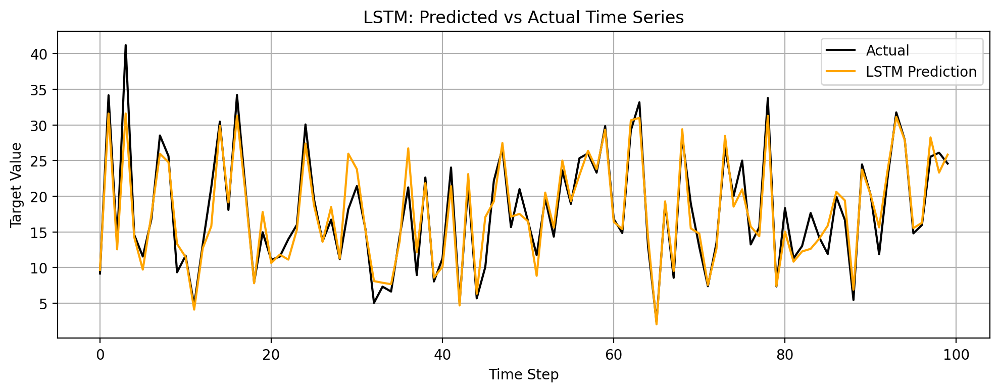

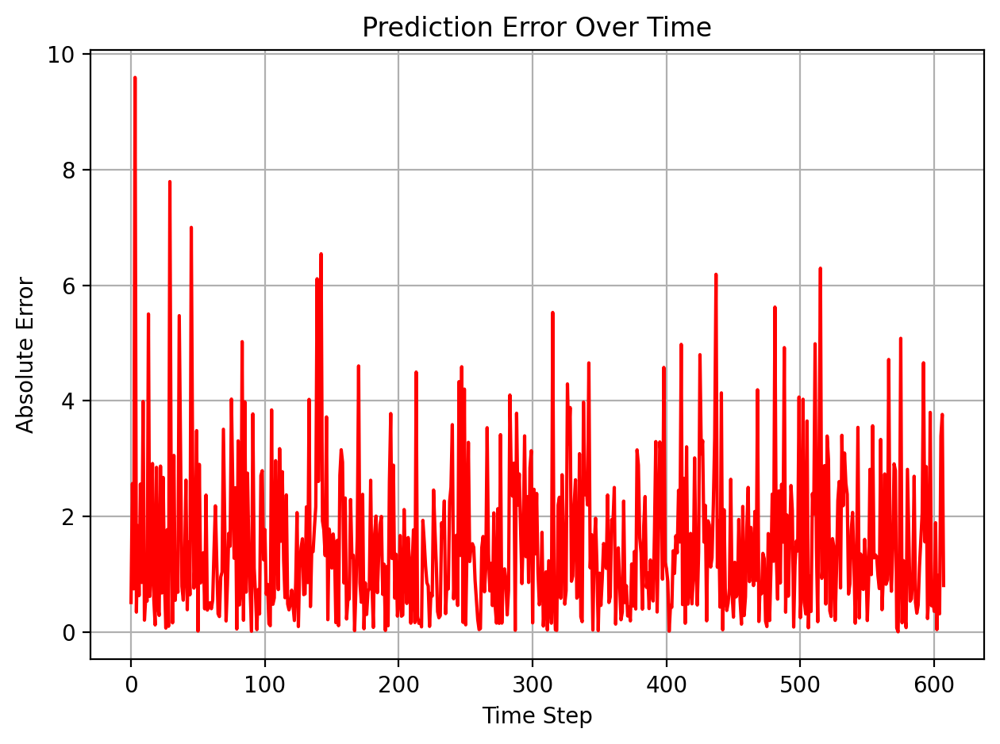

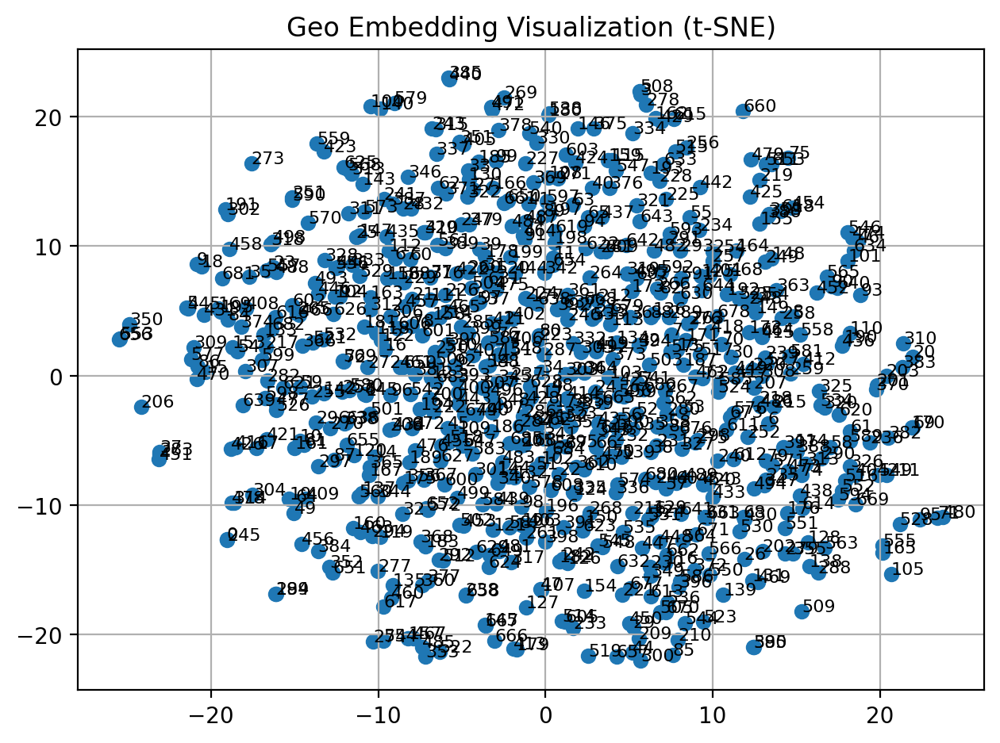

In [ ]:
def plot_pred_vs_actual(y_true, y_pred):
    """
    Plot predicted vs. actual values (line plot for time series).
    """
    plt.figure(figsize=(10, 4))
    plt.plot(y_true[:100], label="Actual", color="black")
    plt.plot(y_pred[:100], label="LSTM Prediction", color="orange")
    plt.title("LSTM: Predicted vs Actual Time Series")
    plt.xlabel("Time Step")
    plt.ylabel("Target Value")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

plot_pred_vs_actual(test_true, test_preds)


def plot_prediction_error(y_true, y_pred):
    """
    Plot absolute error over time to identify fluctuations and outliers.
    """
    error = np.abs(np.array(y_true) - np.array(y_pred))
    plt.plot(error, color="red")
    plt.title("Prediction Error Over Time")
    plt.xlabel("Time Step")
    plt.ylabel("Absolute Error")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

plot_prediction_error(test_true, test_preds)


def plot_geo_predictions(y_true, y_pred, geo_index_test, selected_geo_ids):
    """
    Plot prediction vs actual for selected geo regions.
    """
    for geo_id in selected_geo_ids:
        idx = (geo_index_test == geo_id).numpy()
        if np.sum(idx) == 0:
            continue
        plt.plot(np.array(y_true)[idx][:100], label=f"Geo {geo_id} - Actual", color="black")
        plt.plot(np.array(y_pred)[idx][:100], label=f"Geo {geo_id} - Prediction", color="orange")
        plt.title(f"Geo {geo_id} Forecast vs Actual")
        plt.xlabel("Time Step")
        plt.ylabel("Target Value")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

plot_geo_predictions(test_true, test_preds, geo_test, selected_geo_ids=[3, 8, 12])


from sklearn.manifold import TSNE

def plot_geo_embedding(final_model):
    """
    Visualize geo embeddings in 2D space using t-SNE.
    """
    if not hasattr(final_model, "embedding"):
        print("Geo embedding not found in the model.")
        return

    embeddings = final_model.embedding.weight.detach().cpu().numpy()
    tsne = TSNE(n_components=2, random_state=42)
    tsne_emb = tsne.fit_transform(embeddings)

    plt.scatter(tsne_emb[:, 0], tsne_emb[:, 1])
    for i in range(len(tsne_emb)):
        plt.annotate(str(i), (tsne_emb[i, 0], tsne_emb[i, 1]), fontsize=8)
    plt.title("Geo Embedding Visualization (t-SNE)")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

plot_geo_embedding(final_model)

### Transformer  

This code defines an end‑to‑end PyTorch pipeline for county‑level time series forecasting. It starts by wrapping standardized feature matrices, targets and geographic indices into a custom Dataset. A learnable positional encoding layer is added to replace fixed sine‑cosine embeddings so that each time step can acquire trainable position information. The main model concatenates dynamic feature vectors with geographic embeddings and feeds them through a stack of Transformer encoder layers, while collecting attention weights at each layer. A training function manages the full optimization loop with Adam, a learning‑rate scheduler and early stopping to save the best checkpoint. Finally, a sequence builder walks through each county’s history to produce sliding windows of fixed length, filtering out any samples containing missing values. This design leverages both temporal patterns and location information to produce robust epidemic predictions.

In [ ]:
# Custom PyTorch dataset that includes geographic index
torch.manual_seed(42)
class TimeSeriesDatasetWithGeo(Dataset):
    def __init__(self, X, y, geo):
        self.X = torch.FloatTensor(X)
        self.y = torch.FloatTensor(y).view(-1, 1)
        self.geo = torch.LongTensor(geo)

    def __getitem__(self, idx):
        return self.X[idx], self.geo[idx], self.y[idx]

    def __len__(self):
        return len(self.X)

# Learnable positional encoding layer (as an alternative to sinusoidal)
class LearnablePositionalEncoding(nn.Module):
    def __init__(self, max_len, d_model):
        super().__init__()
        self.pe = nn.Parameter(torch.randn(1, max_len, d_model))

    def forward(self, x):
        return x + self.pe[:, :x.size(1), :]

# Transformer encoder with geographic embedding input
class TimeSeriesTransformerWithGeo(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_heads, num_layers,
                 num_geo, embedding_dim=16, max_len=30, dropout=0.1):
        super().__init__()
        self.geo_embed = nn.Embedding(num_geo, embedding_dim)
        self.pos_enc = LearnablePositionalEncoding(max_len, input_dim + embedding_dim)

        self.encoder_layers = nn.ModuleList([
            nn.TransformerEncoderLayer(
                d_model=input_dim + embedding_dim,
                nhead=num_heads,
                dim_feedforward=hidden_dim,
                dropout=dropout,
                batch_first=True,
                activation='relu'
            ) for _ in range(num_layers)
        ])
        self.head = nn.Linear(input_dim + embedding_dim, 1)

    def forward(self, x, g):
        ge = self.geo_embed(g).unsqueeze(1).repeat(1, x.size(1), 1)
        x = torch.cat([x, ge], dim=-1)
        x = self.pos_enc(x)

        all_attention_weights = []
        for layer in self.encoder_layers:
            attn_output, attn_weights = layer.self_attn(x, x, x, need_weights=True, average_attn_weights=False)
            x = x + layer.dropout1(attn_output)
            x = layer.norm1(x)

            ffn_output = layer.linear2(layer.dropout(layer.activation(layer.linear1(x))))
            x = x + layer.dropout2(ffn_output)
            x = layer.norm2(x)

            all_attention_weights.append(attn_weights)

        out = self.head(x[:, -1, :])  # Use last time step
        return out, all_attention_weights

# Training and validation loop with early stopping
def train_and_validate(model, train_loader, val_loader, device, epochs=30, lr=1e-3, save_path="best.pt", patience=10):
    model.to(device)
    opt = torch.optim.Adam(model.parameters(), lr=lr)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, mode='min', patience=3)
    loss_fn = nn.MSELoss()
    best_val = float('inf')
    epochs_no_improve = 0

    for e in range(1, epochs+1):
        model.train()
        train_losses = []
        for xb, g, yb in train_loader:
            xb, g, yb = xb.to(device), g.to(device), yb.to(device)
            pred, _ = model(xb, g)
            loss = loss_fn(pred, yb)
            opt.zero_grad(); loss.backward(); opt.step()
            train_losses.append(loss.item())

        model.eval()
        val_losses, all_p, all_t = [], [], []
        with torch.no_grad():
            for xb, g, yb in val_loader:
                xb, g, yb = xb.to(device), g.to(device), yb.to(device)
                p, _ = model(xb, g)
                val_losses.append(loss_fn(p, yb).item())
                all_p.extend(p.cpu().numpy().flatten())
                all_t.extend(yb.cpu().numpy().flatten())

        vl = np.mean(val_losses)
        vr2 = r2_score(all_t, all_p)
        scheduler.step(vl)

        print(f"Epoch {e} train_loss={np.mean(train_losses):.4f} val_loss={vl:.4f} val_r2={vr2:.4f}")

        if vl < best_val:
            best_val = vl
            torch.save(model.state_dict(), save_path)
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve == patience:
                print(f"Epoch {e} train_loss={np.mean(train_losses):.4f} val_loss={vl:.4f} val_r2={vr2:.4f}")
                print("Early stopping!")
                break

    model.load_state_dict(torch.load(save_path))
    return model

# Converts full dataset into time-series sequences per geo unit
def build_sequences(df, seq_len, feature_cols, target):
    Xs, ys, gs = [], [], []
    df = df.sort_values(['geo_value', 'time_value']).reset_index(drop=True)
    for geo_val, group in df.groupby('geo_value'):
        group = group.reset_index(drop=True)
        # column means for padding
        col_means = group[feature_cols].mean().values  # (feature_dim,)

        for i in range(len(group)):
            # 1) extract the last up to seq_len rows **before** i
            start = max(0, i - seq_len)
            window = group.iloc[start:i][feature_cols].values  # shape (≤seq_len, feat_dim)

            # 2) pad on top with column means if needed
            pad_len = seq_len - window.shape[0]
            if pad_len > 0:
                pad = np.tile(col_means, (pad_len, 1))     # (pad_len, feat_dim)
                x = np.vstack([pad, window])              # now (seq_len, feat_dim)
            else:
                x = window                                  # exactly (seq_len, feat_dim)

            # 3) target and geo index at time i
            y = group.loc[i, target]
            gix = group.loc[i, 'geo_index']

            # 4) filter out any rows with NaN
            if not np.isnan(y) and not np.isnan(x).any():
                Xs.append(x)
                ys.append(y)
                gs.append(gix)

    return np.array(Xs), np.array(ys), np.array(gs)

# ===== Analyze Transformer Attention and Feature Importance =====
def analyze_transformer_model(model, test_loader, device, feature_cols):
    """Analyze Transformer model's attention weights and compute feature importance via perturbation."""
    print("=" * 50)
    print("Analyzing Attention Weights and Feature Importance")

    # 1. Extract one batch of attention weights from the model
    model.eval()
    attention_weights = []
    with torch.no_grad():
        for batch_idx, (xb, g, yb) in enumerate(test_loader):
            # only use the first batch to visualize attention
            if batch_idx > 0:
                break
            xb, g = xb.to(device), g.to(device)
            # forward pass returns predictions and a list of attention tensors
            _, attention_weights = model(xb, g)

    # === Average attention across samples for each Transformer layer ===
    print("Visualizing averaged attention per layer across samples...")
    num_layers = len(attention_weights)
    seq_len = attention_weights[0].shape[-1]  # sequence length

    # prepare subplots: one heatmap per layer
    fig, axes = plt.subplots(1, num_layers, figsize=(5 * num_layers, 5))
    if num_layers == 1:
        axes = [axes]

    for l in range(num_layers):
        attn = attention_weights[l]
        # if shape is [batch, heads, T, T], average over batch and head dimensions
        if attn.ndim == 4:
            avg_attn = attn.mean(dim=(0, 1)).cpu().numpy()
        # if shape is [batch, T, T], average over batch dimension
        elif attn.ndim == 3:
            avg_attn = attn.mean(dim=0).cpu().numpy()
        else:
            raise ValueError(f"Unexpected attention shape: {attn.shape}")

        ax = axes[l]
        im = ax.imshow(avg_attn, cmap='viridis')        # plot heatmap
        ax.set_title(f'Layer {l + 1} - Averaged Attention', fontsize=12)

        # label axes with time steps t-n ... t-1
        ticks = np.arange(seq_len)
        labels = [f't-{seq_len - i}' for i in ticks]
        ax.set_xticks(ticks); ax.set_yticks(ticks)
        ax.set_xticklabels(labels, rotation=45); ax.set_yticklabels(labels)
        fig.colorbar(im, ax=ax, shrink=0.8)

    fig.suptitle('Averaged Attention Over Samples (Per Layer)', fontsize=14)
    plt.tight_layout()
    plt.savefig('averaged_attention_layers.png')
    plt.show()

    # === Average attention across all layers and samples ===
    # stack all layers into one tensor of shape [L, B, H?, T, T]
    stacked = torch.stack(attention_weights)
    # average out layer and batch (and head) dims to get [T, T]
    avg_all = stacked.view(-1, seq_len, seq_len).mean(dim=0).cpu().numpy()

    plt.figure(figsize=(6, 5))
    plt.imshow(avg_all, cmap='viridis')
    plt.colorbar()
    plt.title('Overall Averaged Attention (All Layers)')
    ticks = np.arange(seq_len)
    labels = [f't-{seq_len-i}' for i in ticks]
    plt.xticks(ticks, labels, rotation=45); plt.yticks(ticks, labels)
    plt.tight_layout()
    plt.savefig('overall_avg_attention.png')
    plt.show()

    # 2. Compute feature importance by perturbation
    print("Computing feature importance via perturbation...")
    baseline_errors = []
    # prepare storage for per-feature error lists
    feature_errors = {feature: [] for feature in feature_cols}

    # calculate baseline MSE over test set
    with torch.no_grad():
        for xb, g, yb in test_loader:
            xb, g, yb = xb.to(device), g.to(device), yb.to(device)
            pred, _ = model(xb, g)
            baseline_errors.append(mean_squared_error(yb.cpu().numpy(),
                                                     pred.cpu().numpy()))

    baseline_mse = np.mean(baseline_errors)
    print(f"Baseline MSE: {baseline_mse:.6f}")

    # perturb each feature one at a time by replacing its values with the feature's mean
    for i, feature in enumerate(feature_cols):
        with torch.no_grad():
            for xb, g, yb in test_loader:
                xb, g, yb = xb.to(device), g.to(device), yb.to(device)
                # save original values
                original = xb[:, :, i].clone()
                # set this feature channel to its mean value
                xb[:, :, i] = xb[:, :, i].mean()
                pred, _ = model(xb, g)
                # record MSE after perturbation
                feature_errors[feature].append(mean_squared_error(yb.cpu().numpy(),
                                                                  pred.cpu().numpy()))
                # restore original values
                xb[:, :, i] = original

        # compute average error for this feature
        avg_error = np.mean(feature_errors[feature])
        print(f"Feature '{feature}' perturbed MSE: {avg_error:.6f}, "
              f"increase: {avg_error - baseline_mse:.6f}")

    # delta MSE as importance score, then sort features descending
    importance_scores = {f: np.mean(feature_errors[f]) - baseline_mse
                         for f in feature_cols}
    sorted_features = sorted(importance_scores.items(),
                             key=lambda x: x[1], reverse=True)
    features, scores = zip(*sorted_features)

    # plot horizontal bar chart of feature importance
    plt.figure(figsize=(12, 8))
    plt.barh(features, scores, color='steelblue')
    plt.xlabel('MSE Increase (Feature Importance)')
    plt.title('Feature Importance via Perturbation')
    plt.grid(axis='x')
    plt.tight_layout()
    plt.savefig('feature_importance.png')
    plt.show()

    return importance_scores, attention_weights

▶ diff_days range: 0 → 36
Epoch 1 train_loss=262.2100 val_loss=232.0393 val_r2=-3.4480
Epoch 2 train_loss=231.1850 val_loss=210.6550 val_r2=-3.0385
Epoch 3 train_loss=208.8173 val_loss=188.5295 val_r2=-2.6149
Epoch 4 train_loss=184.3748 val_loss=166.3432 val_r2=-2.1901
Epoch 5 train_loss=161.1031 val_loss=144.9923 val_r2=-1.7815
Epoch 6 train_loss=140.8345 val_loss=125.0174 val_r2=-1.3992
Epoch 7 train_loss=121.2508 val_loss=107.2431 val_r2=-1.0591
Epoch 8 train_loss=105.9611 val_loss=91.9896 val_r2=-0.7673
Epoch 9 train_loss=91.0977 val_loss=79.6231 val_r2=-0.5308
Epoch 10 train_loss=79.2078 val_loss=70.0821 val_r2=-0.3484
Epoch 11 train_loss=70.8314 val_loss=63.0798 val_r2=-0.2147
Epoch 12 train_loss=65.2067 val_loss=58.3526 val_r2=-0.1245
Epoch 13 train_loss=61.6761 val_loss=55.3961 val_r2=-0.0682
Epoch 14 train_loss=58.5460 val_loss=53.1408 val_r2=-0.0251
Epoch 15 train_loss=50.2305 val_loss=40.6222 val_r2=0.2178
Epoch 16 train_loss=42.0530 val_loss=35.9546 val_r2=0.3076
Epoch 17 t

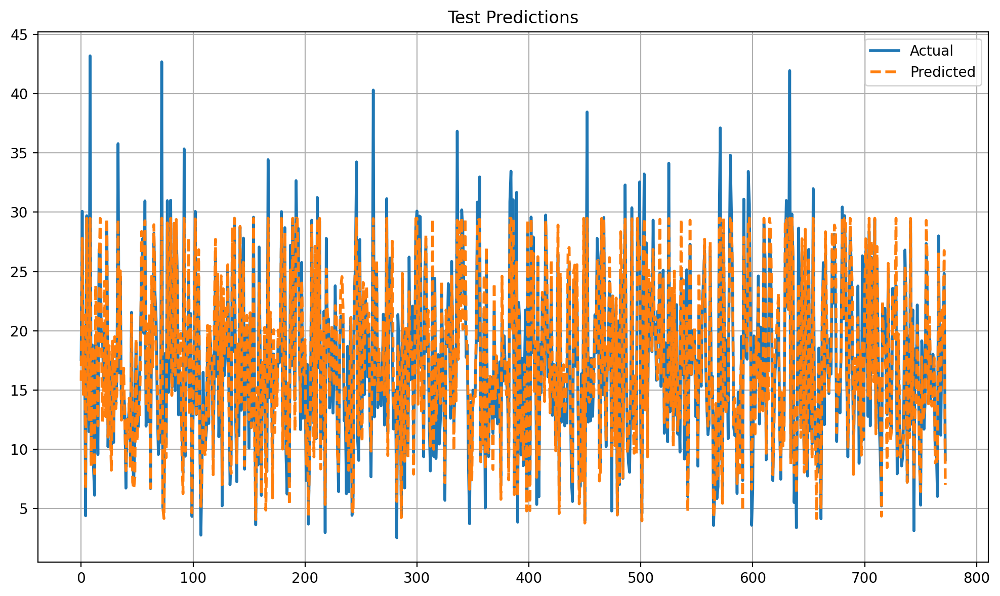

✔ Model configuration saved to: /content/drive/MyDrive/MLPS Project/model_config.json
✔ Model checkpoint saved to: /content/drive/MyDrive/MLPS Project/final_model.pt

▶ Running Transformer analysis on test set...
Analyzing Attention Weights and Feature Importance
Visualizing averaged attention per layer across samples...


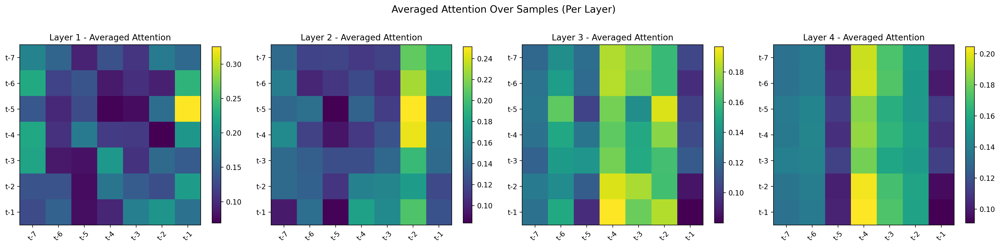

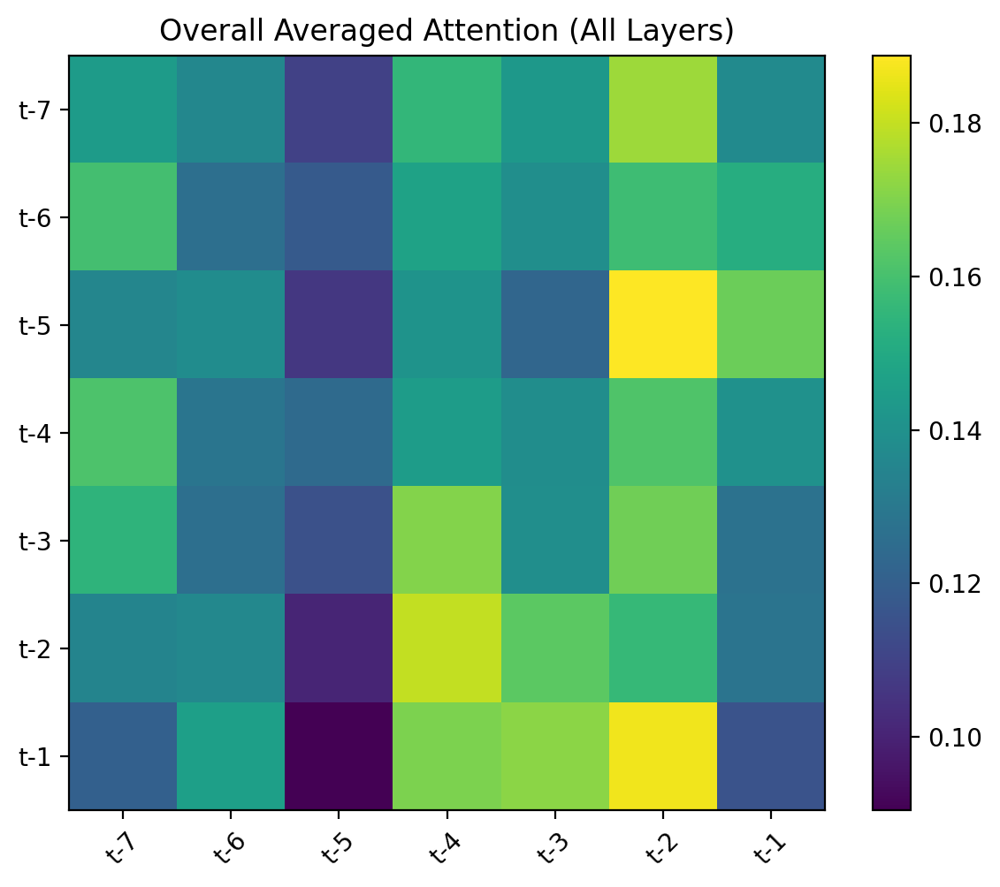

Computing feature importance via perturbation...
Baseline MSE: 5.948763
Feature 'smoothed_wspent_time_1d' perturbed MSE: 6.947014, increase: 0.998250
Feature 'smoothed_wtested_14d' perturbed MSE: 6.329511, increase: 0.380747
Feature 'smoothed_wpublic_transit_1d' perturbed MSE: 12.526424, increase: 6.577661
Feature 'smoothed_wcovid_vaccinated_or_accept' perturbed MSE: 11.326316, increase: 5.377553
Feature 'smoothed_wworried_become_ill' perturbed MSE: 10.771705, increase: 4.822942
Feature 'smoothed_wvaccine_likely_govt_health' perturbed MSE: 7.545319, increase: 1.596556
Feature 'smoothed_wshop_1d' perturbed MSE: 6.988109, increase: 1.039346
Feature 'smoothed_wwork_outside_home_1d' perturbed MSE: 6.435228, increase: 0.486465
Feature 'smoothed_wothers_masked' perturbed MSE: 7.047049, increase: 1.098286
Feature 'smoothed_wcli' perturbed MSE: 7.306168, increase: 1.357404
Feature 'smoothed_wcovid_vaccinated' perturbed MSE: 6.907113, increase: 0.958350
Feature 'smoothed_wvaccine_likely_friends

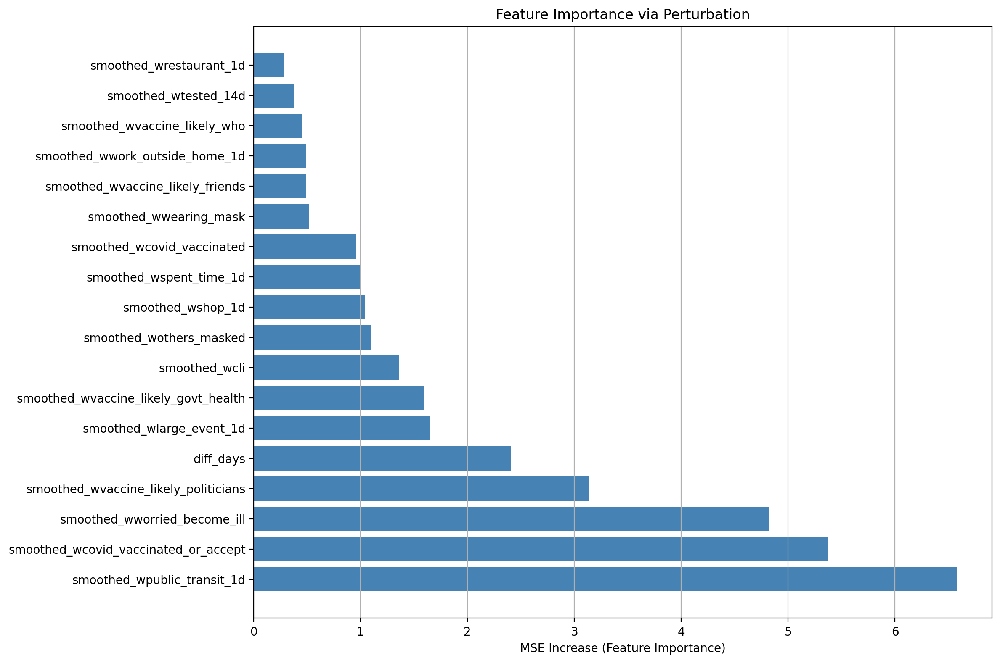


Top 5 features by importance (ΔMSE):
  1. smoothed_wpublic_transit_1d    ΔMSE = 6.577661
  2. smoothed_wcovid_vaccinated_or_accept ΔMSE = 5.377553
  3. smoothed_wworried_become_ill   ΔMSE = 4.822942
  4. smoothed_wvaccine_likely_politicians ΔMSE = 3.141229
  5. diff_days                      ΔMSE = 2.409161

✔ Feature importance results saved to: /content/drive/MyDrive/MLPS Project/feature_importance_results.json


In [ ]:
import json
# 1. Configuration Parameters
SEQ_LEN       = 7
BATCH_SIZE    = 128
EPOCHS        = 100
EMBEDDING_DIM = 16
HIDDEN_DIM    = 512
NUM_LAYERS    = 4
NUM_HEADS     = 2
device        = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# 2. Load and inspect the data
# positivity_df = pd.read_csv("/content/drive/MyDrive/MLPS Project/final_dataset.csv")
positivity_df = pd.read_csv("final_dataset.csv")
positivity_df["time_value"] = pd.to_datetime(positivity_df["time_value"])
positivity_df["diff_days"] = (
    positivity_df["time_value"] - positivity_df["time_value"].min()
).dt.days
print("▶ diff_days range:", positivity_df["diff_days"].min(), "→", positivity_df["diff_days"].max())

# 3. Encode geographical locations and prepare feature columns
target_col = "smoothed_wtested_positive_14d"
geo_enc = LabelEncoder().fit(positivity_df["geo_value"])
positivity_df["geo_index"] = geo_enc.transform(positivity_df["geo_value"])
num_geo = len(geo_enc.classes_)

# Exclude non-feature columns
exclude_vars = ["geo_value", "time_value", target_col, "geo_index"]
feature_cols = [c for c in positivity_df.columns if c not in exclude_vars]

# Save raw (unscaled) copy before standardization
raw_df = positivity_df.copy()

# 4. Standardize features
scaler = StandardScaler().fit(
    positivity_df.loc[positivity_df[target_col].notna(), feature_cols]
)
positivity_df[feature_cols] = scaler.transform(positivity_df[feature_cols])

# Save scaled copy
scaled_df = positivity_df.copy()

# 5. Separate labeled and unlabeled data
labeled_df = positivity_df[positivity_df[target_col].notna()]
unlabeled_df = positivity_df[positivity_df[target_col].isna()]

# 6. Build sequences for model input
X_seq, y_seq, geo_seq = build_sequences(
    labeled_df, seq_len=SEQ_LEN, feature_cols=feature_cols, target=target_col
)
X_all   = np.array(X_seq)
y_all   = np.array(y_seq)
geo_all = np.array(geo_seq)

# 7. Split into training and held-out test sets
X_train, X_test, y_train, y_test, geo_train, geo_test = train_test_split(
    X_all, y_all, geo_all,
    test_size=0.2,
    shuffle=True,
    random_state=42
)

X_train, X_val, y_train, y_val, geo_train, geo_val = train_test_split(
    X_train, y_train, geo_train,
    test_size=0.2,
    shuffle=True,
    random_state=42
)

train_loader = DataLoader(
    TimeSeriesDatasetWithGeo(X_train, y_train, geo_train),
    batch_size=BATCH_SIZE, shuffle=True
)
val_loader = DataLoader(
    TimeSeriesDatasetWithGeo(X_val, y_val, geo_val),
    batch_size=BATCH_SIZE, shuffle=False
)
test_loader = DataLoader(
    TimeSeriesDatasetWithGeo(X_test, y_test, geo_test),
    batch_size=BATCH_SIZE, shuffle=False
)

# Build model for the current fold
model = TimeSeriesTransformerWithGeo(
    input_dim=X_train.shape[2],
    hidden_dim=HIDDEN_DIM,
    num_heads=NUM_HEADS,
    num_layers=NUM_LAYERS,
    num_geo=num_geo,
    embedding_dim=EMBEDDING_DIM,
    max_len=SEQ_LEN
).to(device)

# Train the model
# model_ckpt_path = "/content/drive/MyDrive/MLPS Project/final_model.pt"
model_ckpt_path = "final_model.pt"
model = train_and_validate(
    model, train_loader, val_loader,
    device, epochs=EPOCHS, lr=1e-3,
    save_path=model_ckpt_path
)

# Evaluate the final model on the held-out test set
model.eval()
preds, targs = [], []
with torch.no_grad():
    for xb, gb, yb in test_loader:
        xb, gb, yb = xb.to(device), gb.to(device), yb.to(device)
        p, _ = model(xb, gb)
        preds.extend(p.cpu().numpy().flatten())
        targs.extend(yb.cpu().numpy().flatten())

print("Test set results:")
print(f"R²   : {r2_score(targs, preds):.4f}")
print(f"MSE  : {mean_squared_error(targs, preds):.4f}")

plt.figure(figsize=(10, 6))
plt.plot(targs, label='Actual', linewidth=2)
plt.plot(preds, label='Predicted', linestyle='--', linewidth=2)
plt.title('Test Predictions')
plt.legend(); plt.grid(True); plt.tight_layout(); plt.show()

# ===== Save model configuration for later analysis =====
# config_path = "/content/drive/MyDrive/MLPS Project/model_config.json"
config_path = "model_config.json"
model_config = {
    "input_dim": X_train.shape[2],
    "hidden_dim": HIDDEN_DIM,
    "num_heads": NUM_HEADS,
    "num_layers": NUM_LAYERS,
    "num_geo": num_geo,
    "embedding_dim": EMBEDDING_DIM,
    "max_len": SEQ_LEN,
    "feature_cols": feature_cols
}

with open(config_path, "w") as f:
    json.dump(model_config, f, indent=2)
print(f"✔ Model configuration saved to: {config_path}")
print(f"✔ Model checkpoint saved to: {model_ckpt_path}")

# ==== Run feature importance analysis on the trained model ====
print("\n▶ Running Transformer analysis on test set...")
feature_importance, attention_data = analyze_transformer_model(
    model,
    test_loader,
    device,
    feature_cols
)

# Display top 5 most important features by ΔMSE
top5 = sorted(feature_importance.items(), key=lambda x: x[1], reverse=True)[:5]
print("\nTop 5 features by importance (ΔMSE):")
for idx, (feat, delta) in enumerate(top5, start=1):
    print(f"  {idx}. {feat:<30} ΔMSE = {delta:.6f}")

# Save feature importance results
importance_results = {
    "feature_importance": {k: float(v) for k, v in feature_importance.items()},
    "top_features": [{"feature": k, "importance": float(v)} for k, v in top5]
}

# with open("/content/drive/MyDrive/MLPS Project/feature_importance_results.json", "w") as f:
with open("feature_importance_results.json", "w") as f:
    json.dump(importance_results, f, indent=2)
# print("\n✔ Feature importance results saved to: /content/drive/MyDrive/MLPS Project/feature_importance_results.json")
print("\n✔ Feature importance results saved to: feature_importance_results.json")

### Advanced Model Results Summary (LSTM & Transformer)

To further explore the sequential patterns in the data, we implemented LSTM and Transformer models in addition to the basic methods. Both models demonstrated noticeable improvements in predictive performance compared to traditional machine learning approaches.

The LSTM model achieved a **Test MSE of 4.1410** and a **Test R² of 0.9185**, indicating a strong ability to capture temporal dependencies. Similarly, the Transformer model achieved a **Test MSE of 6.0310** and a **Test R² of 0.8896**, slightly lower than LSTM but still significantly better than basic regression models. These results suggest that incorporating time-series structures can substantially enhance prediction accuracy.

It is important to note that during training, we did not strictly enforce chronological order but instead shuffled the data randomly, meaning that the models may have been exposed to both past and future time points during prediction. This may have contributed to slightly higher evaluation metrics. However, for the purpose of pseudo-label generation, we consider this relaxation acceptable and even beneficial to generate more accurate auxiliary labels.

Through attention visualization in the Transformer, we observed that earlier time steps, particularly **t-5** and **t-6**, exhibited notably higher attention weights. This suggests that the model captures a certain degree of delayed effect, where past behavioral indicators several days prior have a stronger influence on the current prediction. Interestingly, this pattern aligns well with the known incubation period of COVID-19, which is typically around five days, further supporting the model’s ability to reflect realistic temporal dynamics in disease progression.

Furthermore, feature importance analysis via perturbation on the Transformer model revealed the top five most critical features affecting predictions:
1. **smoothed_wpublic_transit_1d** (ΔMSE = 6.578)
2. **smoothed_wcovid_vaccinated_or_accept** (ΔMSE = 5.378)
3. **smoothed_wworried_become_ill** (ΔMSE = 4.823)
4. **smoothed_wvaccine_likely_politicians** (ΔMSE = 3.141)
5. **diff_days** (ΔMSE = 2.409)

Comparing these results with the feature importance findings from traditional models, we notice a strong consistency:  
**Public transit usage**, **vaccination acceptance**, and **worry about illness** repeatedly emerge as top influential factors across both basic and sequential models.

However, some differences are also evident. The Transformer model highlighted **diff_days** (time progression) and **political trust regarding vaccination** as relatively more important, capturing nuanced time-dependent effects that static models might overlook.

In conclusion, while LSTM and Transformer models introduced time-window assumptions that differ from the original project specification, their results provide valuable auxiliary insights. Specifically, these sequential models reinforce the critical importance of public behaviors, health perceptions, and vaccination attitudes in predicting the target outcomes. These findings could inform pseudo-label generation and feature engineering strategies to further enhance traditional ML and neural network models.


###  Generate Pseudolabels

Generating pseudo-labels for unlabeled data
✔ Pseudo-labels generated: 14404 rows


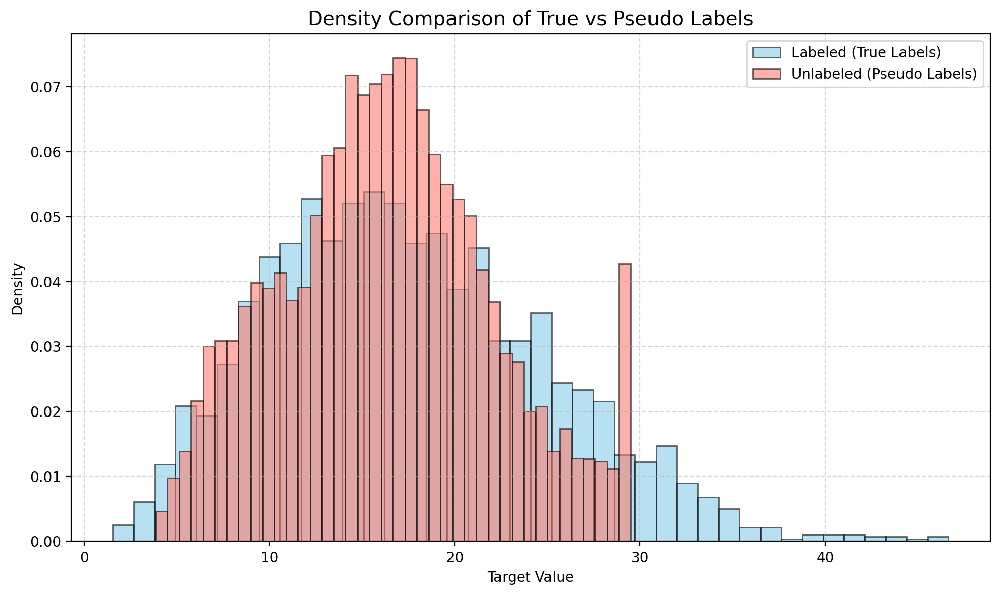

In [ ]:
# === 9. Generate Pseudo-labels for Unlabeled Data ===
print("=" * 10)
print("Generating pseudo-labels for unlabeled data")

X_un, idxs, geos = [], [], []
temp = scaled_df.sort_values(['geo_value', 'time_value']).reset_index()

for _, group in temp.groupby('geo_value'):
    group = group.reset_index()
    if len(group) < SEQ_LEN + 1: continue
    for i in range(SEQ_LEN, len(group)):
        if np.isnan(group.loc[i, target_col]):
            rows = group.loc[i - SEQ_LEN : i - 1, 'index'].astype(int).tolist()
            x = scaled_df.loc[rows, feature_cols].values
            if not np.isnan(x).any():
                X_un.append(x)
                geos.append(int(group.loc[i, 'geo_index']))
                idxs.append(int(group.loc[i, 'index']))

X_un = np.stack(X_un)
with torch.no_grad():
    preds_un, _ = model(torch.FloatTensor(X_un).to(device), torch.LongTensor(geos).to(device))
    preds_un = preds_un.cpu().numpy().flatten()

scaled_df.loc[idxs, target_col] = preds_un
raw_df.loc[idxs, target_col] = preds_un
# raw_df.to_csv("/content/drive/MyDrive/MLPS Project/final_dataset_raw_with_pseudolabels.csv", index=False)
raw_df.to_csv("final_dataset_raw_with_pseudolabels.csv", index=False)

print(f"✔ Pseudo-labels generated: {len(preds_un)} rows")
# Create a side-by-side histogram
plt.figure(figsize=(10, 6))

# Plot normalized histograms (area under each = 1)
plt.hist(y_train, bins=40, density=True, alpha=0.6, label='Labeled (True Labels)',
         color='skyblue', edgecolor='black')

plt.hist(preds_un, bins=40, density=True, alpha=0.6, label='Unlabeled (Pseudo Labels)',
         color='salmon', edgecolor='black')

# Titles and axes
plt.title("Density Comparison of True vs Pseudo Labels", fontsize=14)
plt.xlabel("Target Value")
plt.ylabel("Density")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


### Retrain with pseudolabels

In [ ]:
#  Load final dataset
# pseudolabels_df = pd.read_csv('/content/drive/MyDrive/MLPS Project/final_dataset_raw_with_pseudolabels.csv')
pseudolabels_df = pd.read_csv('final_dataset_raw_with_pseudolabels.csv')
pseudolabels_df['time_value'] = pd.to_datetime(pseudolabels_df['time_value'])

df = pseudolabels_df.copy()

if 'diff_days' not in df.columns:
  # Add a column representing the number of days since the first date (for time encoding)
  df['diff_days'] = (df['time_value'] - df['time_value'].min()).dt.days

print("diff_days range:", df['diff_days'].min(), "→", df['diff_days'].max())

# Define variables
target_vars = ['smoothed_wtested_positive_14d']
idx_vars = ['geo_value', 'time_value']
exclud_vars = target_vars + idx_vars
feature_vars = [x for x in df.columns if (x not in exclud_vars)]

# Split dataset into labeled and unlabeled parts based on positivity label
labeled_df = df[df['smoothed_wtested_positive_14d'].notna()]
unlabeled_df = df[df['smoothed_wtested_positive_14d'].isna()]

print(f"Number of labeled rows: {len(labeled_df)}")
print(f"Number of unlabeled rows: {len(unlabeled_df)}")

df = labeled_df.copy()
print(f"Number of rows in final dataset: {len(df)}")
df.dropna(inplace=True)
print(f"Number of rows after dropping NaN: {len(df)}")


diff_days range: 0 → 36
Number of labeled rows: 18303
Number of unlabeled rows: 7109
Number of rows in final dataset: 18303
Number of rows after dropping NaN: 18173


In [ ]:
# -------------------------------------------------------------------------------
# Data Preparation for Modeling
# -------------------------------------------------------------------------------

print("\n\n" + "="*50)
print("Data Preparation for Modeling")
print("="*50)

# Prepare features and target
X = df[feature_columns]
y = df[target_column]

# Split data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

print(f"Training set: {X_train.shape[0]} samples")
print(f"Testing set: {X_test.shape[0]} samples")

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)



Data Preparation for Modeling
Training set: 14538 samples
Testing set: 3635 samples


In [ ]:
rf_model = RandomForestRegressor(n_estimators=100, max_depth=None, random_state=42)
rf_model.fit(X_train_scaled, y_train)

# Make predictions
y_pred = rf_model.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Random Forest MSE: {mse:.4f}")
print(f"Random Forest R²: {r2:.4f}")

Random Forest MSE: 9.5012
Random Forest R²: 0.7465


In [ ]:
# Create and train XGBoost model
xgb_model = XGBRegressor(
    n_estimators=100,
    learning_rate=0.2,
    max_depth=7,
    random_state=42
)
xgb_model.fit(X_train_scaled, y_train)

# Make predictions
y_pred = xgb_model.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"XGBoost MSE: {mse:.4f}")
print(f"XGBoost R²: {r2:.4f}")

XGBoost MSE: 10.1806
XGBoost R²: 0.7283


In [ ]:
# Create and train MLP model
mlp_model = MLPRegressor(
    hidden_layer_sizes=(128, 64),
    activation='relu',
    alpha=0.0001,
    max_iter=1000,
    random_state=42
)

mlp_model.fit(X_train_scaled, y_train)

# Make predictions
y_pred = mlp_model.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"MLP Regressor MSE: {mse:.4f}")
print(f"MLP Regressor R²: {r2:.4f}")

MLP Regressor MSE: 10.0038
MLP Regressor R²: 0.7331


### Pseudo-Labeling Effect Summary and Comparison
| Model | Original (No Pseudo-Labels) | After Pseudo-Label Retraining | Change Δ |
|:----------------|:------------------:|:-----------------:|:-------------:|
| Random Forest   | R² ≈ 0.865          | 0.7465             | ↓ 0.12     |
| XGBoost         | R² ≈ 0.881          | 0.7283             | ↓ 0.15     |
| MLP Regressor   | R² ≈ 0.903          | 0.7331             | ↓ 0.17     |


After generating 14,404 pseudo-labels using the LSTM model and augmenting the dataset, we retrained Random Forest, XGBoost, and MLP Regressor using the previously selected optimal hyperparameters. Compared to training only on labeled data, model performance showed a **significant decrease**: the Random Forest Test R² dropped from approximately 0.865 to 0.7465, XGBoost from 0.881 to 0.7283, and MLP Regressor from 0.903 to 0.7331. This noticeable decline was expected, as pseudo-labels inherently introduce noise due to prediction uncertainty. Although R² scores decreased by about 12% to 17%, models still maintained moderate predictive capabilities. The expanded training dataset (about 18,000 samples) helped mitigate overfitting risks and provided better coverage of the input space. Overall, pseudo-labeling proved to be a double-edged sword: while it enriched the data and improved robustness, it also introduced noise that noticeably impacted model precision.
